# Results Analysis for Jag5 latest

In [2]:
import json
import os
from os.path import join
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from rich import print as rich_print

In [3]:
from analysis.files import (
    is_valid_metrics_file,
    unique_ids_from_strings,
    get_name_from_uid,
)

In [4]:
LOG_DIR = "../logs"

[f for f in sorted(os.listdir(LOG_DIR)) if f.startswith("act_lm")]

['act_lm_browsecomp_gt',
 'act_lm_browsecomp_gt_mt4k',
 'act_lm_browsecomp_gt_mt8k',
 'act_lm_snorkel_finance_aprm15',
 'act_lm_snorkel_finance_aprm45',
 'act_lm_snorkel_finance_aprm55',
 'act_lm_snorkel_finance_aprm_fs1_15',
 'act_lm_snorkel_finance_aprm_fs1_45',
 'act_lm_snorkel_finance_gt',
 'act_lm_snorkel_finance_gt_mt4k',
 'act_lm_snorkel_finance_gt_mt4k_tt',
 'act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k',
 'act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k_tt',
 'act_lm_snorkel_insurance_gt',
 'act_lm_snorkel_insurance_gt_mt4k',
 'act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k',
 'act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k',
 'act_lm_taubench_airline_gt',
 'act_lm_taubench_airline_gt_mt4k',
 'act_lm_taubench_airline_gt_mt8k',
 'act_lm_taubench_retail_gt_mt4k',
 'act_lm_treasure',
 'act_lm_tw_coin',
 'act_lm_tw_cooking',
 'act_lm_tw_cooking_fsc_ms1',
 'act_lm_tw_cooking_fsc_ms1_mt10',
 'act_lm_tw_cooking_fsc_ms1_mt10_ml2k',
 'act_lm_tw_cooking_fsc_ms1_mt10_ml4k',
 'act_lm_tw_cooking_

In [5]:
TARGET_FILES = {
    "eval_gen_action_metrics.csv": "csv",
    "eval_lm_action_metrics.csv": "csv",
    "metrics.jsonl": "jsonl",
}

In [6]:
import json
# from rich import print as rich_print

env_and_model_configs = {}

for root, _dirs, files in os.walk(LOG_DIR):
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        else:
            root_str = str(root)
            root_str_parts = root_str.split("/")
            for _idx, subdir in enumerate(root_str_parts):
                if subdir.startswith("act_lm_"):
                    if subdir not in env_and_model_configs:
                        env_and_model_configs[subdir] = {"model": []}
                    _model = root_str_parts[_idx + 1]
                    if _model not in env_and_model_configs[subdir]["model"]:
                        env_and_model_configs[subdir]["model"].append(_model)
                    # break

print(json.dumps(env_and_model_configs, indent=2))

{
  "act_lm_tw_cooking_fsc_ms1_mt20": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_tw_treasure_tt": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k": {
    "model": [
      "Qwen3_8B",
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_taubench_airline_gt": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_browsecomp_gt_mt8k": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_tw_cooking_fsc_ms1_mt10": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_tw_coin": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_taubench_airline_gt_mt4k": {
    "model": [
      "Qwen3_8B",
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_snorkel_finance_aprm_fs1_15": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_snorkel_insurance_gt": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_snorkel_finance_pt

## Plots

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, ScalarFormatter

plt.rcParams.update({
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "font.size": 11,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "legend.fontsize": 9,
    "xtick.labelsize": 9,
    "ytick.labelsize": 10,
    "lines.linewidth": 2.0,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "axes.spines.top": False,
    "axes.spines.right": False,
})


def is_thoughts_actions(label: str) -> bool:
    # Make this as strict/loose as you want:
    s = label.lower()
    return ("thought" in s) or ("thoughts" in s)  # or "Thoughts + Actions" in label

def marker_style_for(label: str, color):
    if is_thoughts_actions(label):
        # filled
        return dict(markerfacecolor=color, markeredgecolor=color, markeredgewidth=0.8)
    else:
        # hollow
        return dict(markerfacecolor="none", markeredgecolor=color, markeredgewidth=1.4)
        

def _clean_axis(ax):
    ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
    ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style="plain", axis="y")
    ax.margins(y=0.10)


def _barplot_first_last(values_first, values_last, labels, title, ylabel, logy=False):
    # Keep a consistent order: sort by last value (often what you care about)
    order = np.argsort(values_last)
    labels = [labels[i] for i in order]
    values_first = [values_first[i] for i in order]
    values_last = [values_last[i] for i in order]

    for which, vals in [("first", values_first), ("last", values_last)]:
        fig, ax = plt.subplots(figsize=(7.5, 3.6))
        x = np.arange(len(labels))
        ax.bar(x, vals)

        ax.set_title(f"{title} ({which} grad_step)")
        ax.set_ylabel(ylabel)
        ax.set_xticks(x)
        ax.set_xticklabels(labels, rotation=35, ha="right")

        if logy:
            ax.set_yscale("log")

        _clean_axis(ax)
        fig.tight_layout()
        plt.show()
        plt.close(fig)


def make_group_color_getter(n_cool: int, n_warm: int):
    # sample evenly through each colormap so colors are distinct
    cool_cmap = plt.get_cmap("cool_r")     # bluish/cyan/magenta
    warm_cmap = plt.get_cmap("autumn")   # red/orange/yellow

    cool_ts = np.linspace(0.15, 0.90, max(n_cool, 1))
    warm_ts = np.linspace(0.15, 0.90, max(n_warm, 1))

    cool_colors = [cool_cmap(t) for t in cool_ts]
    warm_colors = [warm_cmap(t) for t in warm_ts]

    cool_i = 0
    warm_i = 0

    def get_color(label: str):
        nonlocal cool_i, warm_i
        if "Thoughts" in label:
            c = cool_colors[cool_i % len(cool_colors)]
            cool_i += 1
            return c
        else:
            c = warm_colors[warm_i % len(warm_colors)]
            warm_i += 1
            return c

    return get_color

## Try to reconcile keys and models

In [8]:
keys_v1 = ['eval/nll', 'eval/ppl', 'eval/probs', 'eval/step_act_acc', 'eval/task_success', 'eval/task_longest', 'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
keys_v2 =['eval/lm_nll', 'eval/lm_step_acc', 'eval/lm_success', 'eval/lm_longest', 'eval/lm_ppl', 'eval/lm_probs', 'eval/lm_best_ppl', 'eval/lm_best_ppl_step', 'eval/gen_step_acc', 'eval/gen_success', 'eval/gen_longest']

KEY_MAP_FWD = {
    "eval/nll": "eval/lm_nll",
    "eval/ppl": "eval/lm_ppl",
    "eval/probs": "eval/lm_probs",
    "eval/step_act_acc": "eval/lm_step_acc",
    "eval/task_success": "eval/lm_success",
    "eval/task_longest": "eval/lm_longest",
}
KEY_MAP_REV = {v: k for k, v in KEY_MAP_FWD.items()}

In [9]:
VALID_MODEL_CONFIG_MAP = {
    "Qwen3_4B_Instruct_2507": "moco=hf_qwen3_4b_inst_2507",
    "Qwen3_8B": "moco=hf_qwen3_8b",
}

{v: k for k, v in VALID_MODEL_CONFIG_MAP.items()}

{'moco=hf_qwen3_4b_inst_2507': 'Qwen3_4B_Instruct_2507',
 'moco=hf_qwen3_8b': 'Qwen3_8B'}

,grad_step,global_step,eval/nll,eval/ppl,eval/probs,eval/step_act_acc,eval/task_success,eval/task_longest,eval/eval_idx,eval/best_ppl,eval/best_ppl_step,train/loss,train/ppl,train/weight,eval/gen_step_acc_per_task,eval/gen_success_per_task,eval/gen_longest_per_task
0,0,0,1.752144,5.766956,0.173402,0.074553,0.0,0.0,0.0,5.766956,0.0,6.000000,404.000,0.348678,NaN,NaN,NaN
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.593750,13.375,0.729000,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.828125,16.875,0.531441,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.546875,12.750,0.590490,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.562500,35.250,0.166772,NaN,NaN,NaN


3 3
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=

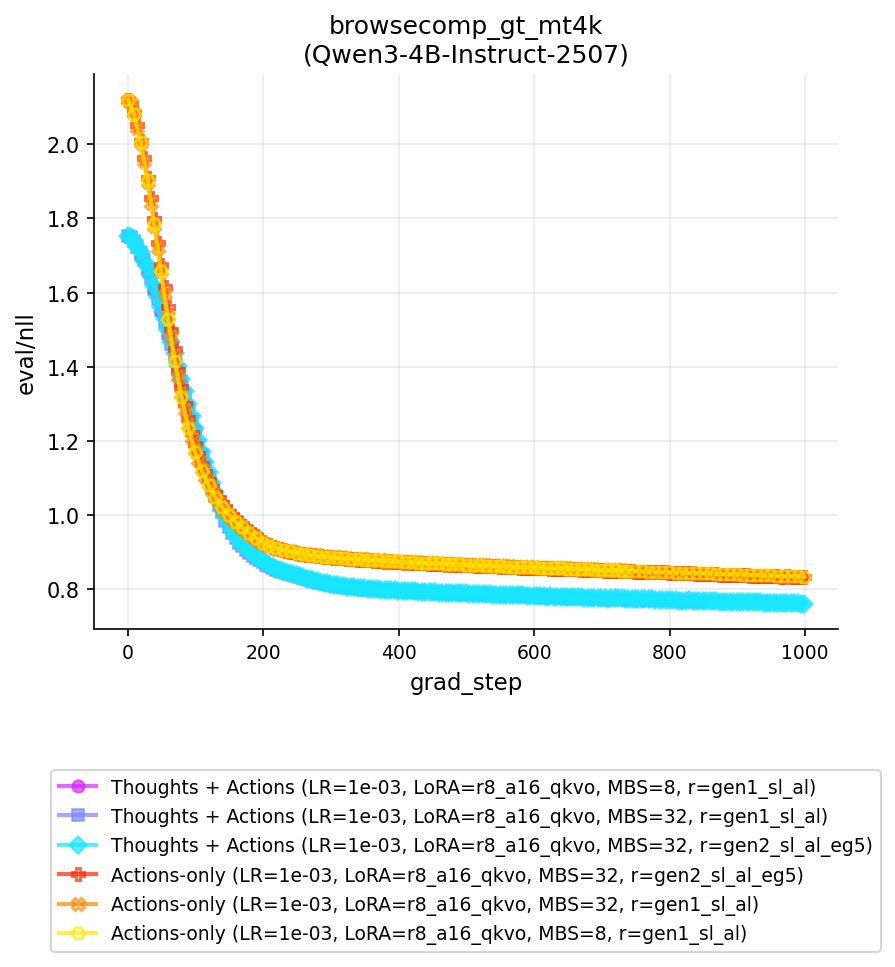

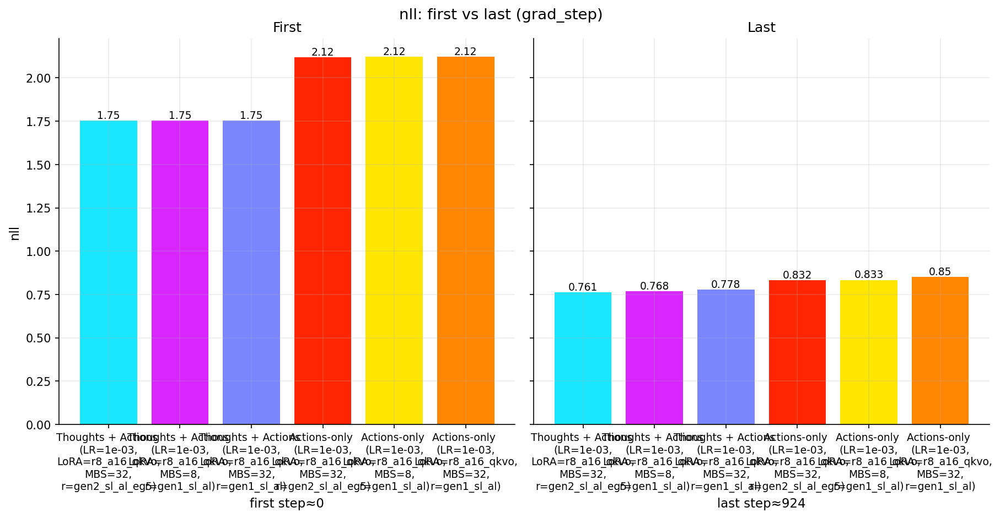

3 3
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=

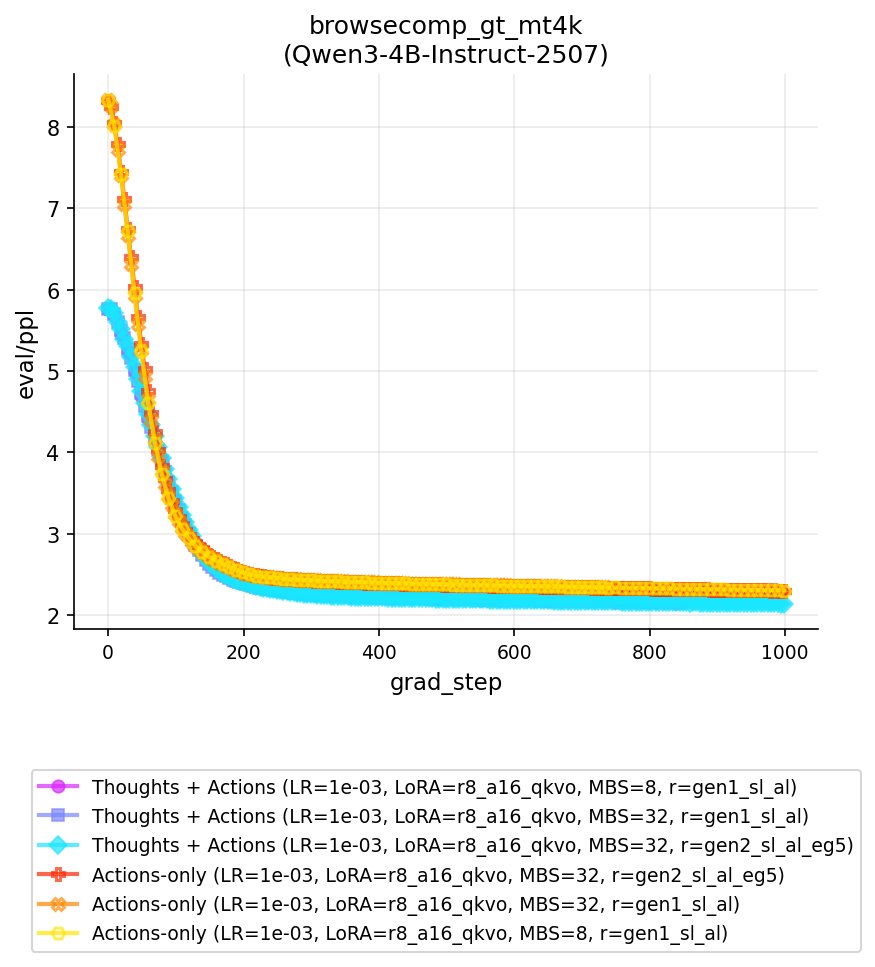

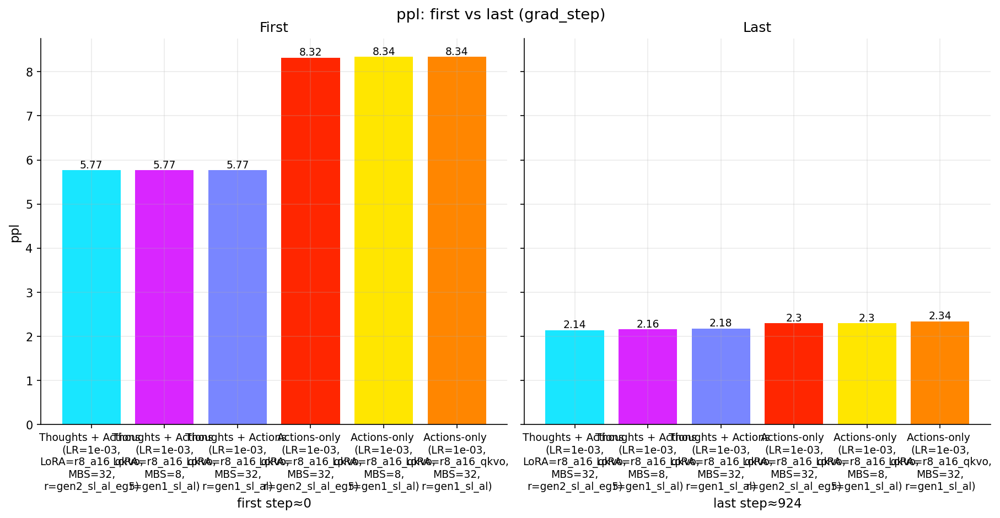

3 3
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=

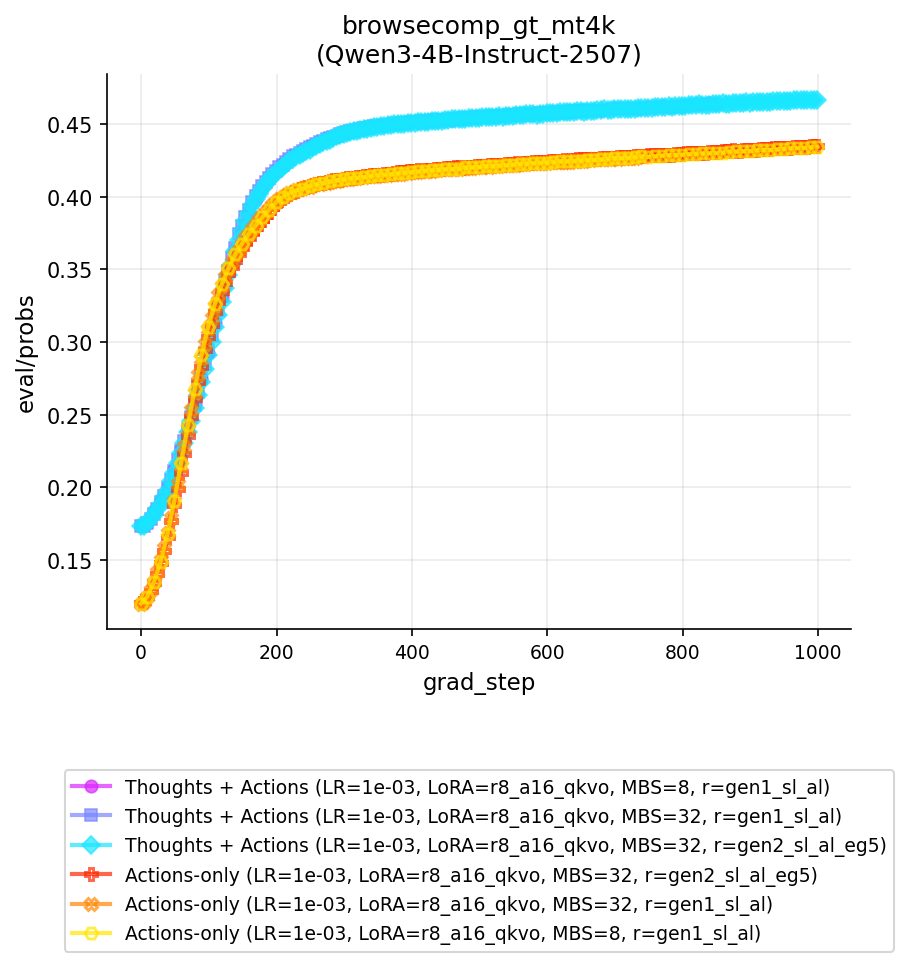

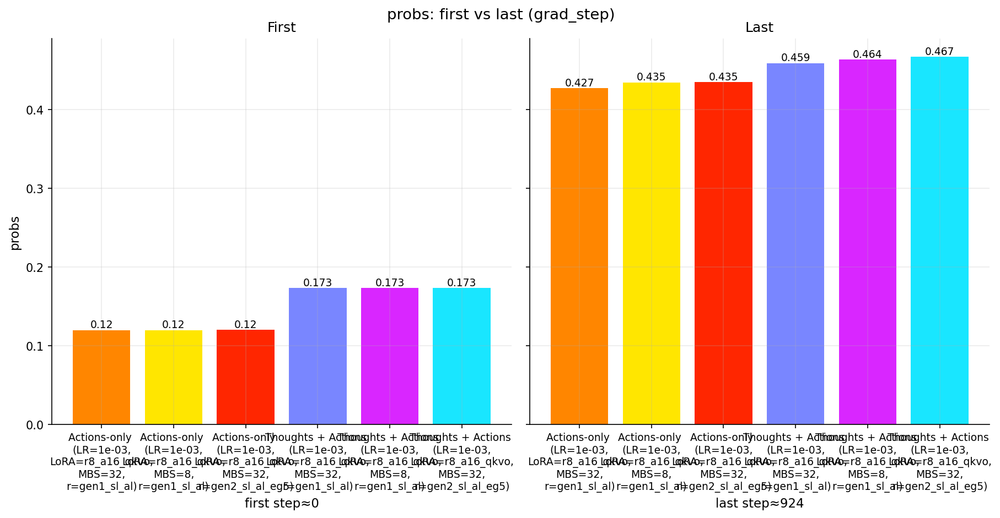

3 3
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=

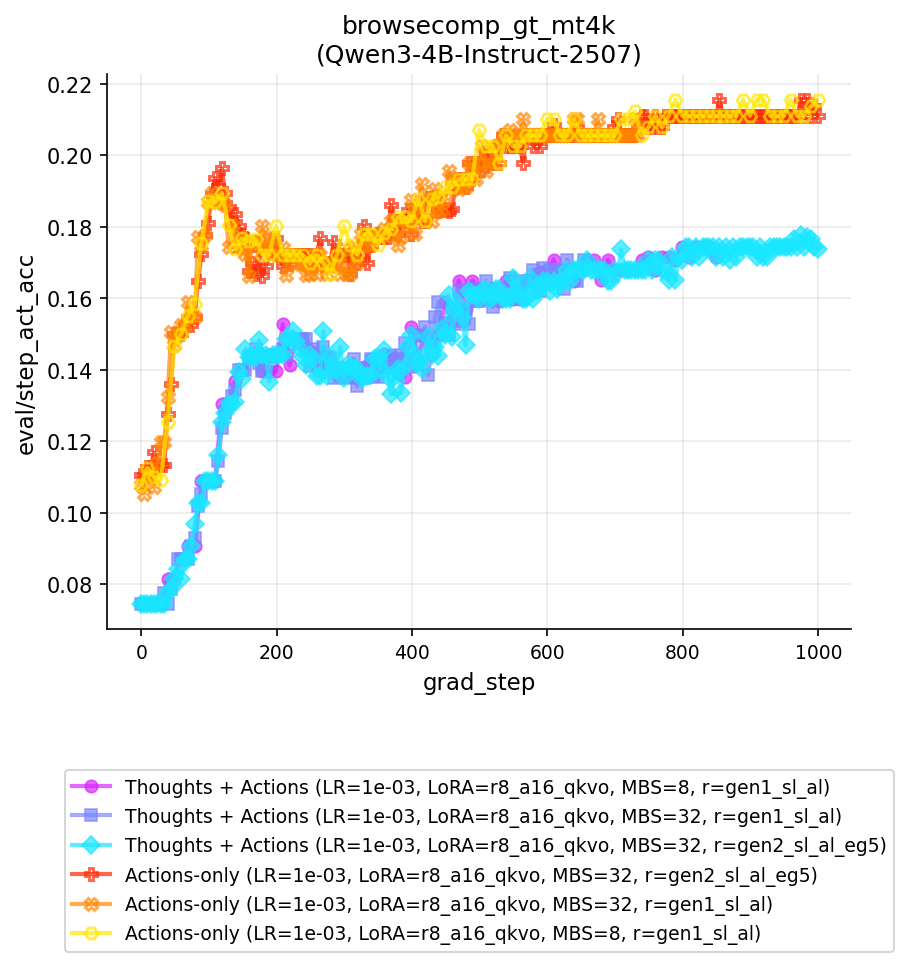

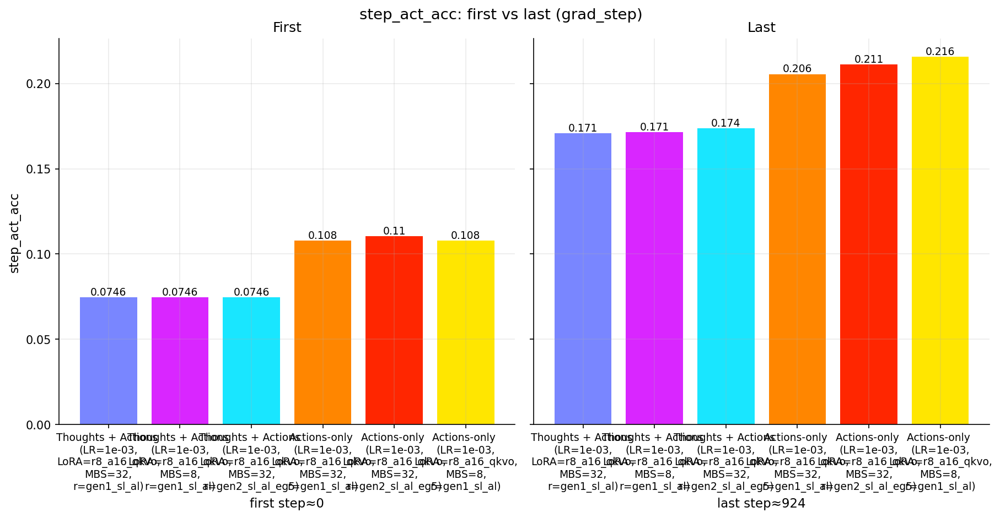

3 3
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=

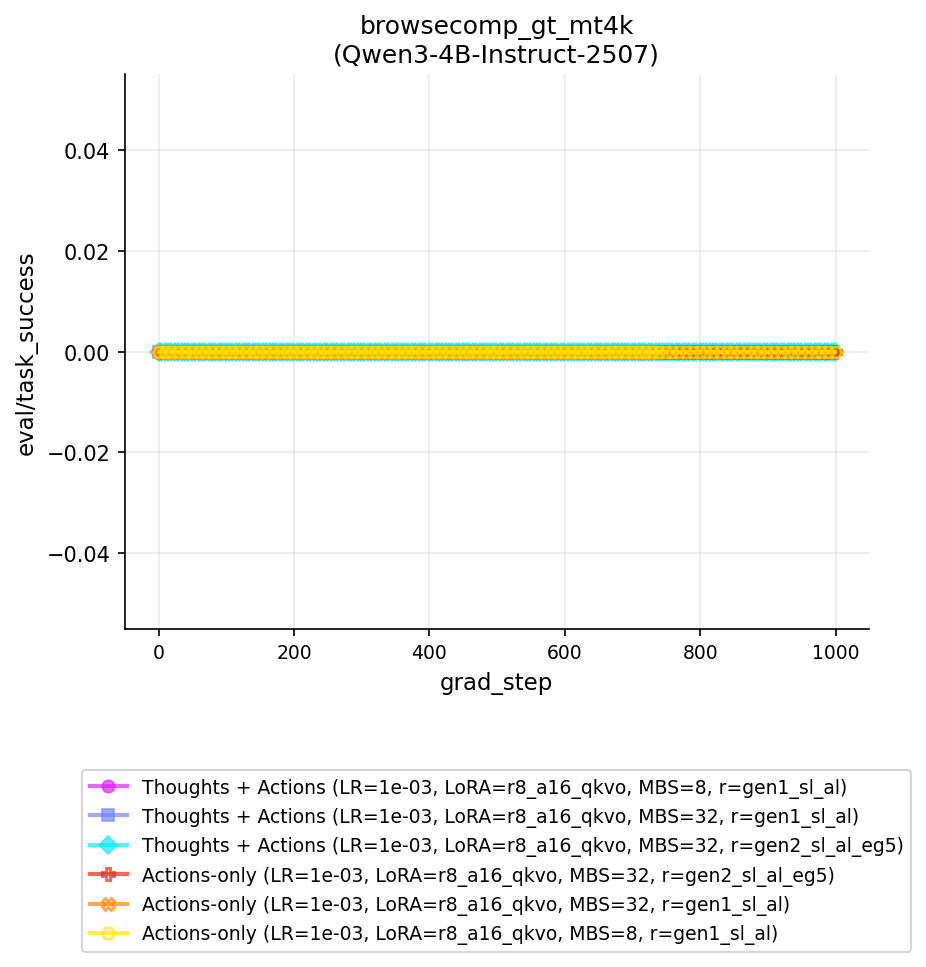

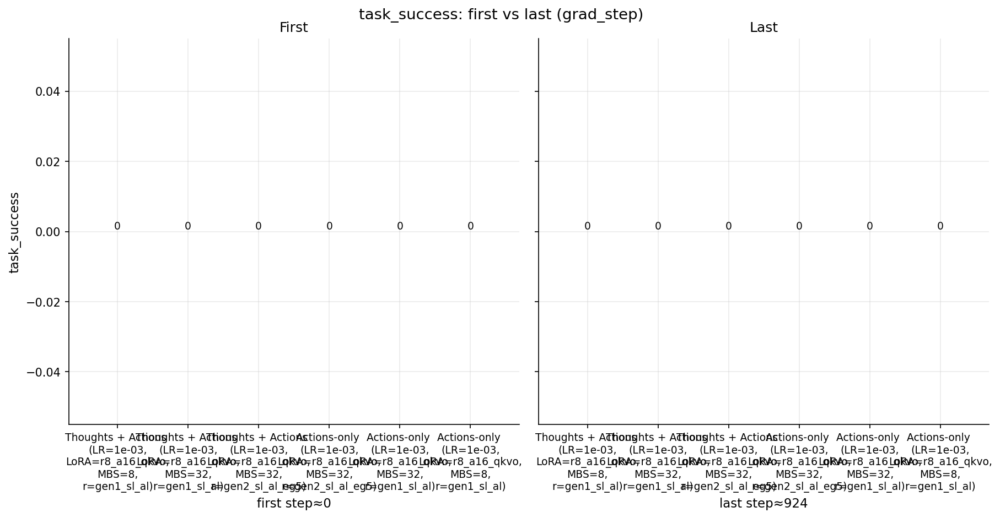

3 3
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=8-hiob=1-lera=0_001-mibasi=8-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_browsecomp_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_browsecomp_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=

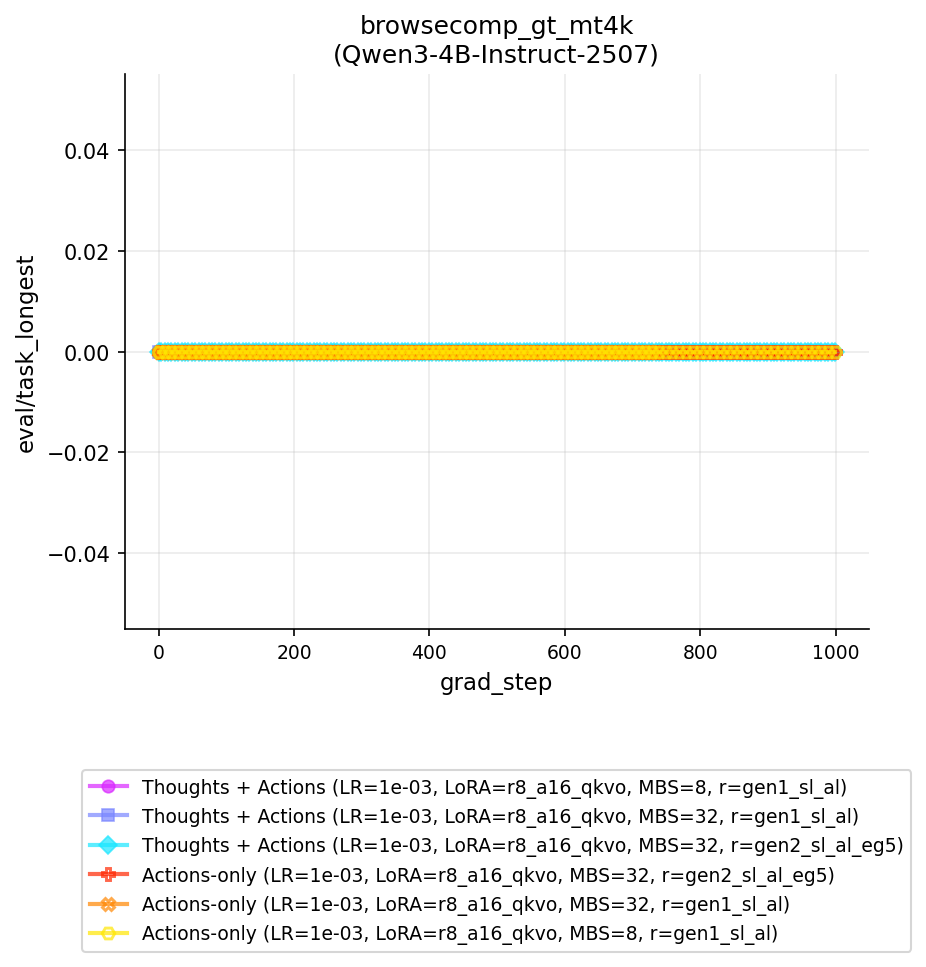

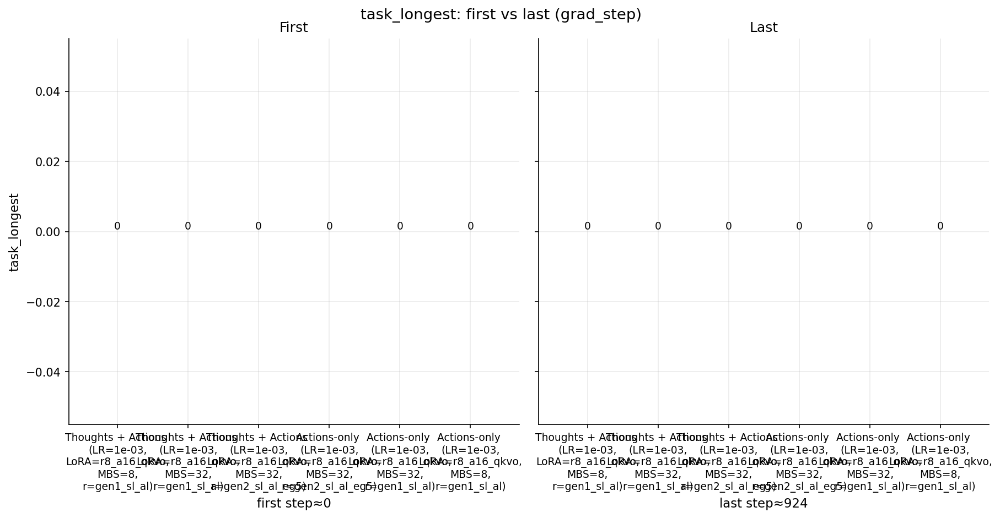

In [13]:
import numpy as np

# base = join(LOG_DIR, "act_lm_snorkel_finance_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_coin", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_treasure", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_browsecomp_gt", "Qwen3_4B_Instruct_2507")
base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")


VALID_MODEL_CONFIG_MAP = {
    'hf_qwen3_4b_inst_2507': 'Qwen3_4B_Instruct_2507',
    'hf_qwen3_8b': 'Qwen3_8B'
}


verbose_labels = True

BARCHART_TYPE = "first"
FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        _model_config = str(p).split("-moco=")[-1].split("-")[0]
        if is_valid_metrics_file(p, kind) and (
            "lera=0_001" in str(p)
            and VALID_MODEL_CONFIG_MAP[_model_config] in str(p)
        ):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)
            # print(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files[FILE_KIND][0], lines=True)
display(df.head())

ignore_cols = ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    print(n_cool, n_warm)
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    marker_idx = 0

    # ---- NEW: collect first values (and first steps if you want to print them) ----
    first_vals = []
    first_steps = []
    last_vals = []
    last_steps = []
    bar_colors = []

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        print("Loading data from", fname)

        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception:
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        df[v] = df[k]
                    elif v in df.columns:
                        df[k] = df[v]
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print(f"Failed to prepare df for {fname}: {e}")
                continue

        label = labels[_idx]
        color = get_color(label)
        marker_style_dict = marker_style_for(label, color)

        # label = label.replace("(", "\n(").replace(", ", ",\n")

        # Line plot
        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=color,
            alpha=0.7,
            **marker_style_dict,
        )
        marker_idx += 1

        # ---- NEW: first value extraction ----
        if len(_df) > 0 and (y_label in _df.columns) and (x_label in _df.columns):
            first_steps.append(float(_df[x_label].iloc[0]))
            first_vals.append(float(_df[y_label].iloc[0]))
            # Also get last values
            last_steps.append(float(_df[x_label].iloc[-1]))
            last_vals.append(float(_df[y_label].iloc[-1]))
            
            # bar_colors.append(get_color(label))  # use same palette logic per label
            bar_colors.append(color)
        else:
            first_steps.append(np.nan)
            first_vals.append(np.nan)
            last_steps.append(np.nan)
            last_vals.append(np.nan)
            # bar_colors.append(get_color(label))
            bar_colors.append(color)
    # Finish line plot
    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    y_anchor = -len(labels) * 0.1
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),
        ncol=1,
        frameon=True,
    )
    plt.show()
    plt.close()

    # ---- NEW: bar charts of first + last values side-by-side ----
    keep = [i for i, v in enumerate(first_vals) if np.isfinite(v) and np.isfinite(last_vals[i])]
    if len(keep) == 0:
        continue

    # Sort consistently (I usually sort by LAST so it's easy to see who ends best)
    order = sorted(keep, key=lambda i: last_vals[i])

    x = np.arange(len(order))

    first_plot_vals = [first_vals[i] for i in order]
    last_plot_vals  = [last_vals[i] for i in order]
    first_plot_steps = [first_steps[i] for i in order]
    last_plot_steps  = [last_steps[i] for i in order]

    lbls = [labels[i] for i in order]
    cols = [bar_colors[i] for i in order]

    # Optional: split labels across multiple lines
    lbls = [lbl.replace("(", "\n(").replace(", ", ",\n") for lbl in lbls]

    fig, (ax0, ax1) = plt.subplots(
        nrows=1, ncols=2,
        # figsize=(12, 4),
        figsize=(12, 6),
        sharey=True,             # important for fair comparison
        constrained_layout=True  # nicer than tight_layout for multi-axes
    )

    # --- First bars ---
    ax0.bar(x, first_plot_vals, color=cols)
    ax0.set_title("First")
    ax0.set_ylabel(key.replace("eval/", ""))
    ax0.set_xticks(x)
    ax0.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, first_plot_vals, first_plot_steps):
        ax0.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show first step under bars
    ax0.set_xlabel(f"first step≈{np.nanmedian(first_plot_steps):.0f}")

    # --- Last bars ---
    ax1.bar(x, last_plot_vals, color=cols)
    ax1.set_title("Last")
    ax1.set_xticks(x)
    ax1.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, last_plot_vals, last_plot_steps):
        ax1.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show last step under bars
    ax1.set_xlabel(f"last step≈{np.nanmedian(last_plot_steps):.0f}")

    fig.suptitle(f"{key.replace('eval/', '')}: first vs last (grad_step)", y=1.02)

    plt.show()
    plt.close(fig)


,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,actions_data_lm_save_path,train/loss,train/ppl,train/weight,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path
0,0,0,0.843078,0.200016,0.0,0.0,2.323509,0.430384,2.323509,0.0,./logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b0...,1.414062,4.125000,0.191207,NaN,NaN,NaN,NaN
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.406250,4.093750,0.568101,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.468750,4.343750,0.795116,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.312500,3.718750,0.551546,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.375000,3.953125,0.432248,NaN,NaN,NaN,NaN


Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

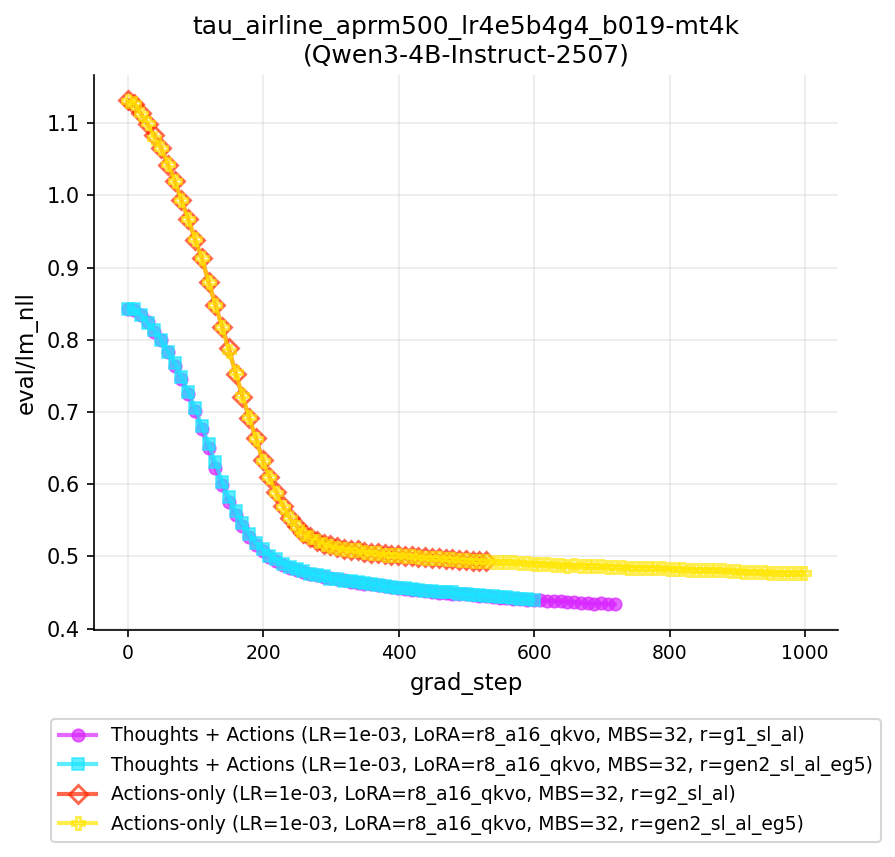

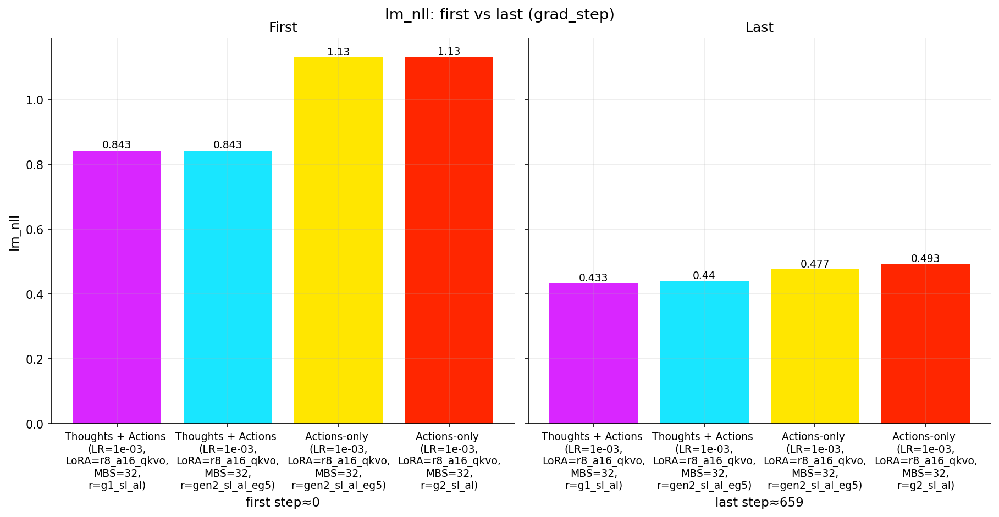

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

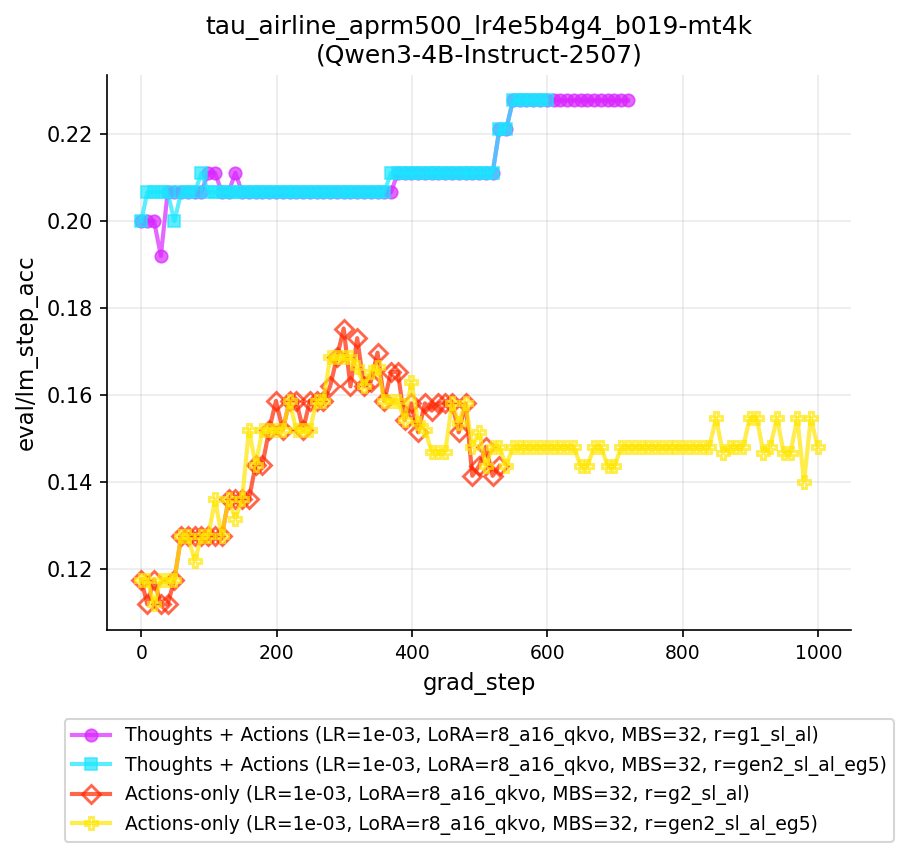

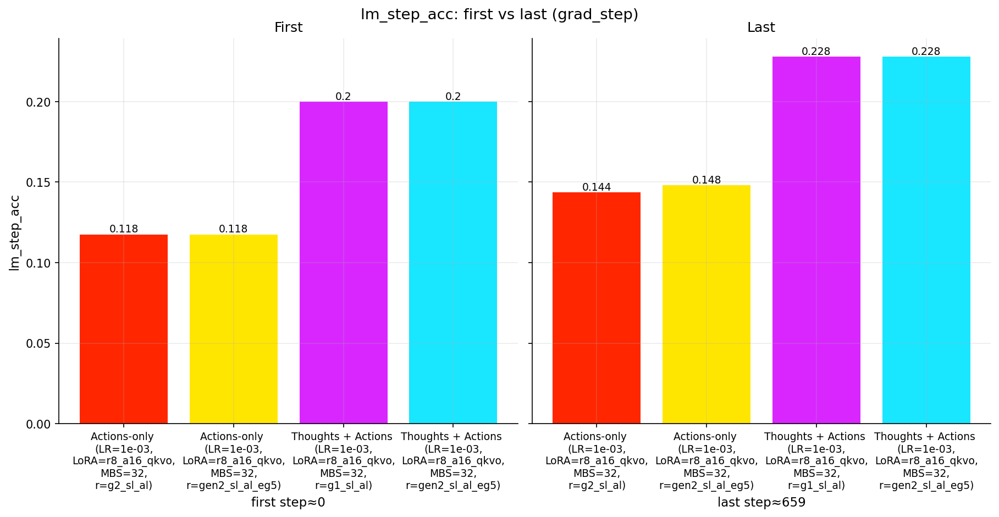

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

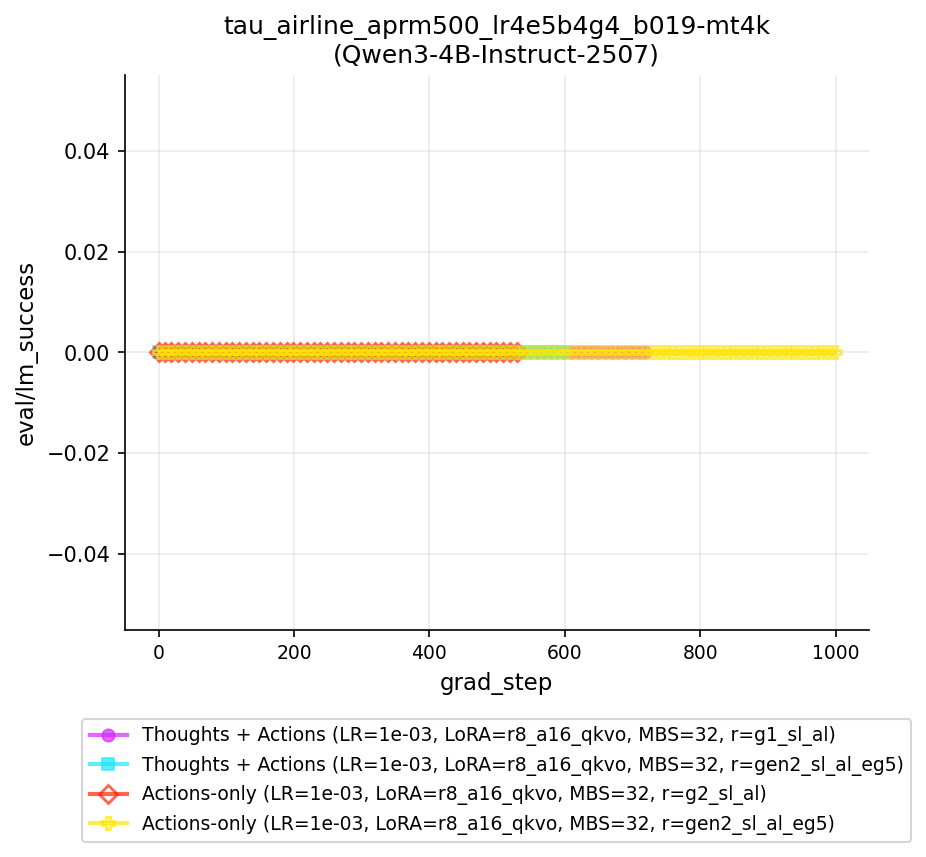

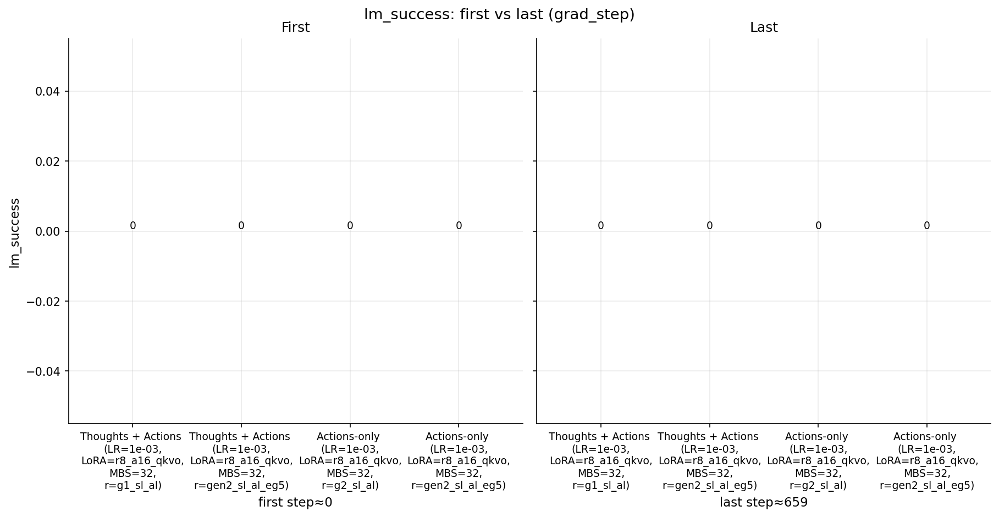

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

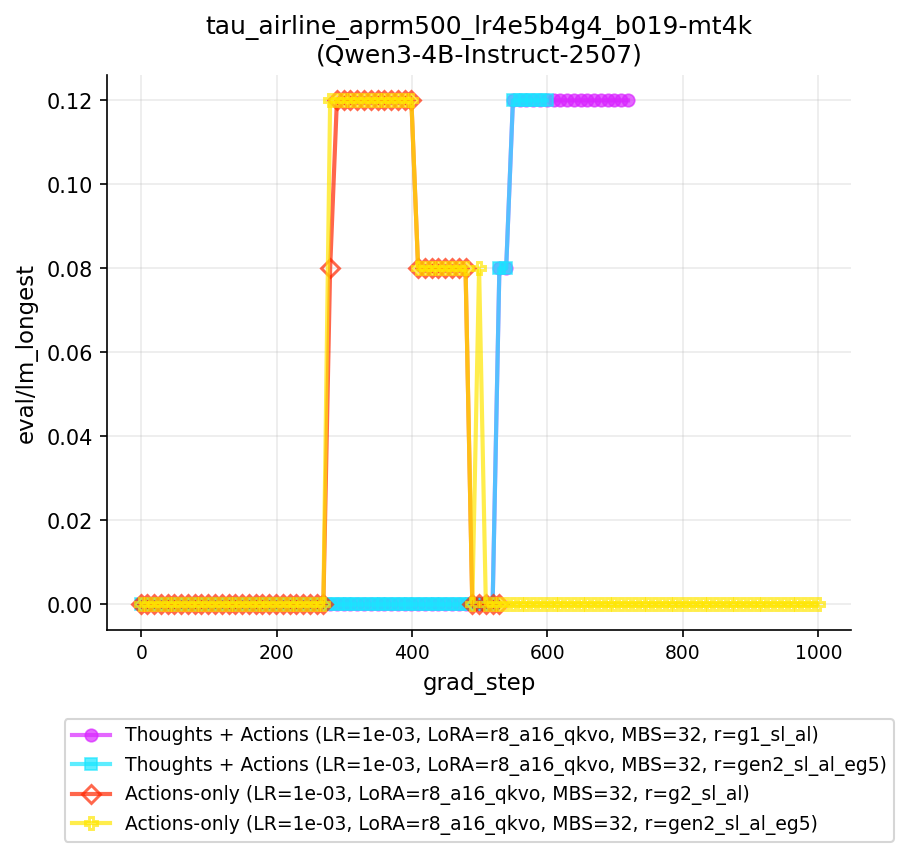

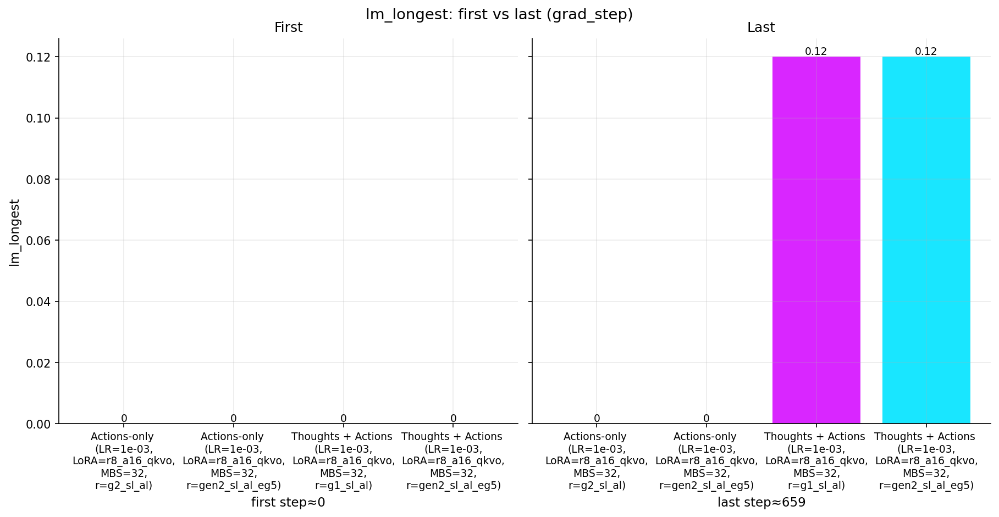

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

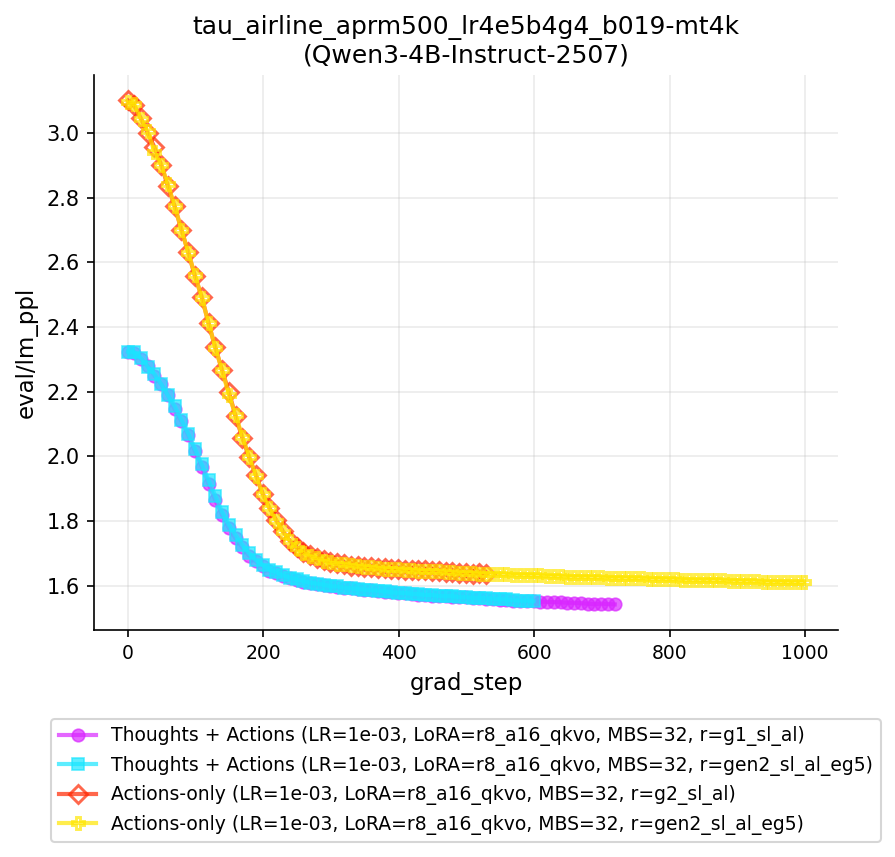

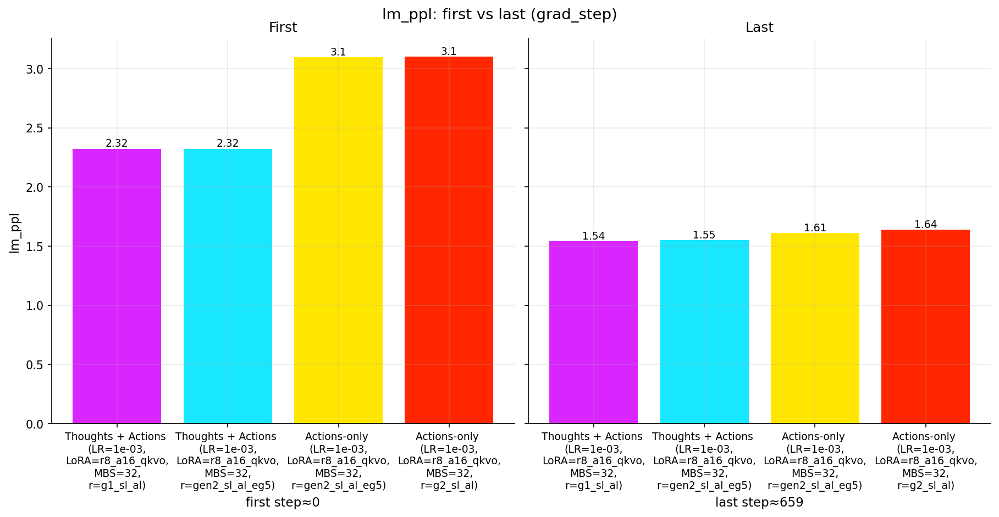

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

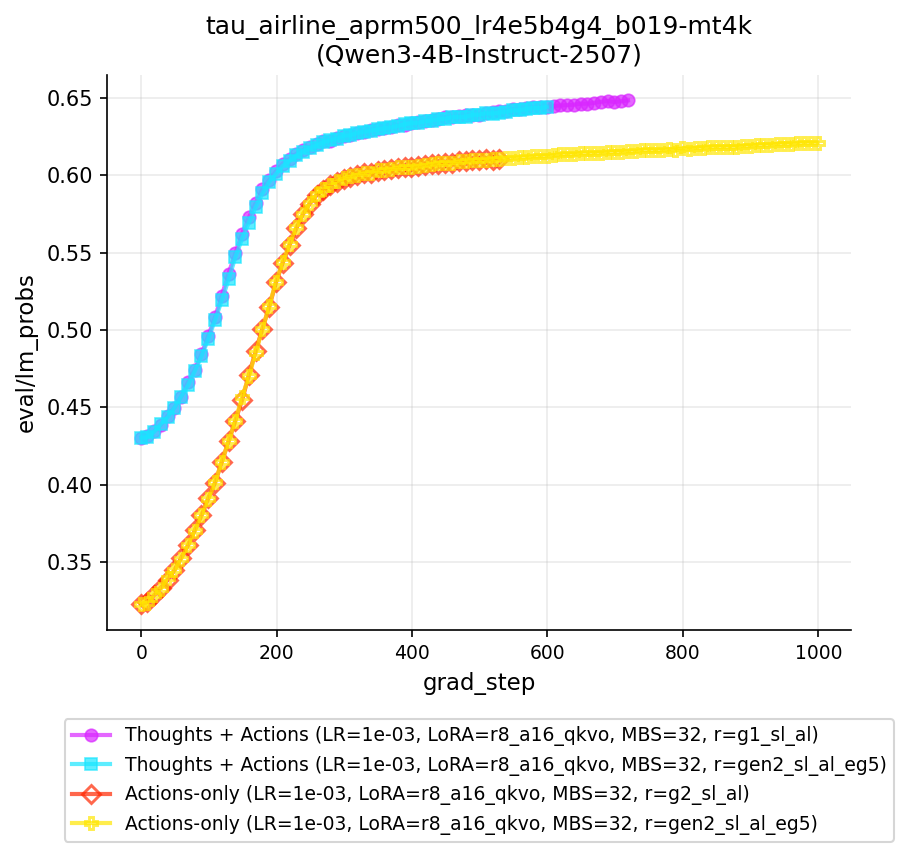

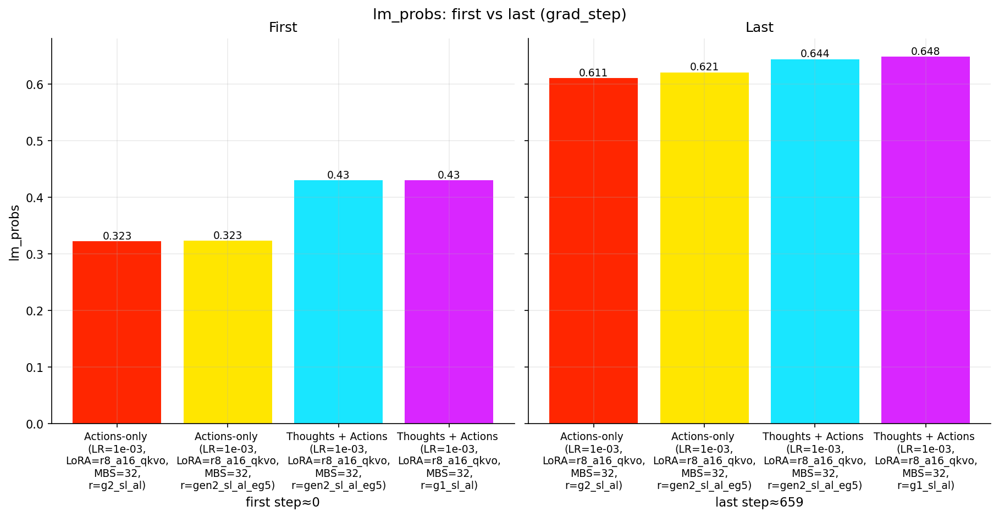

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

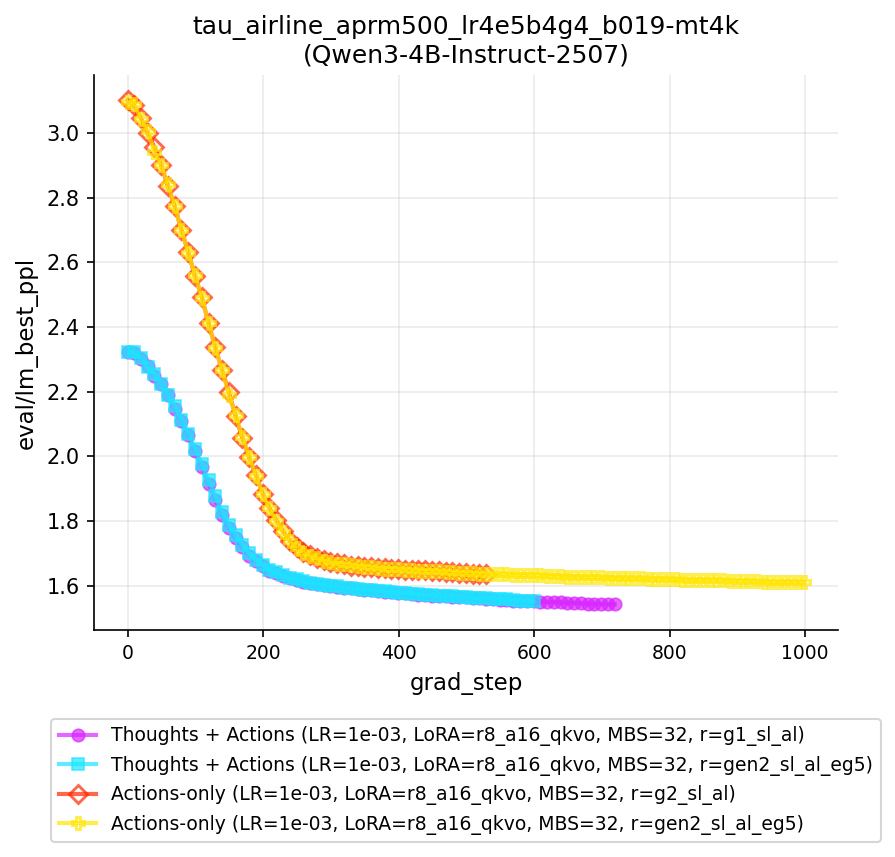

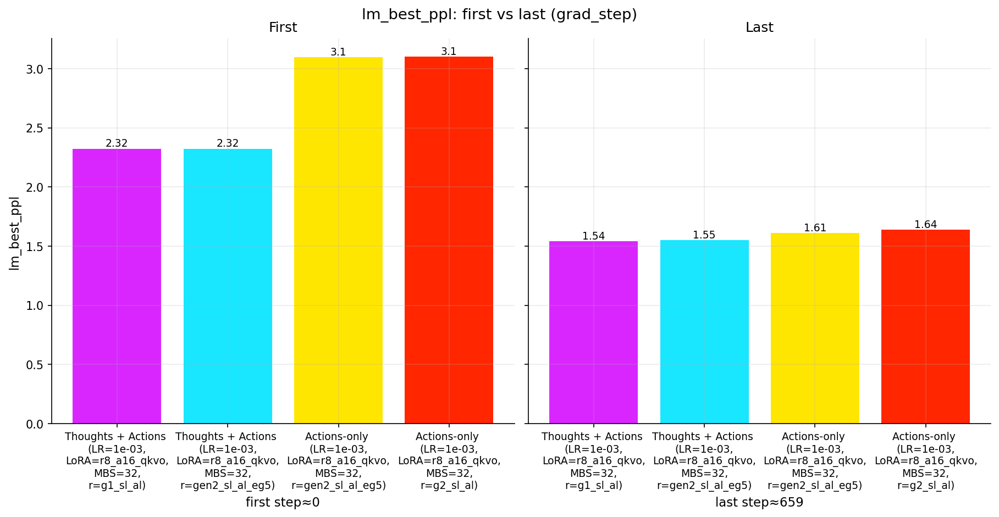

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

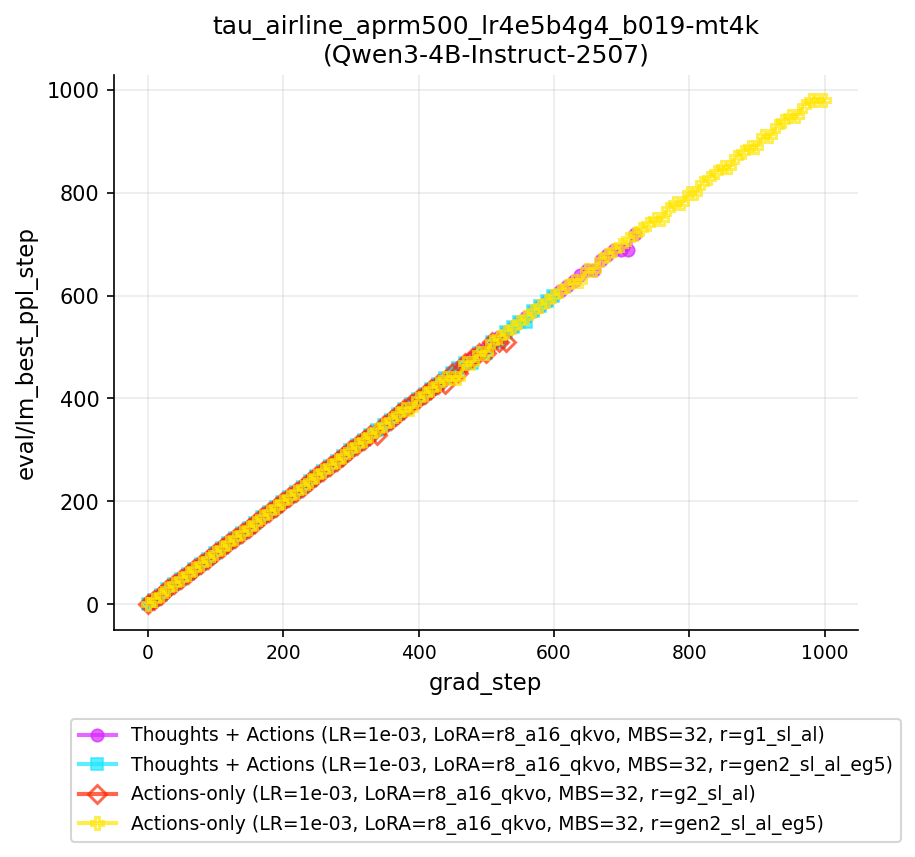

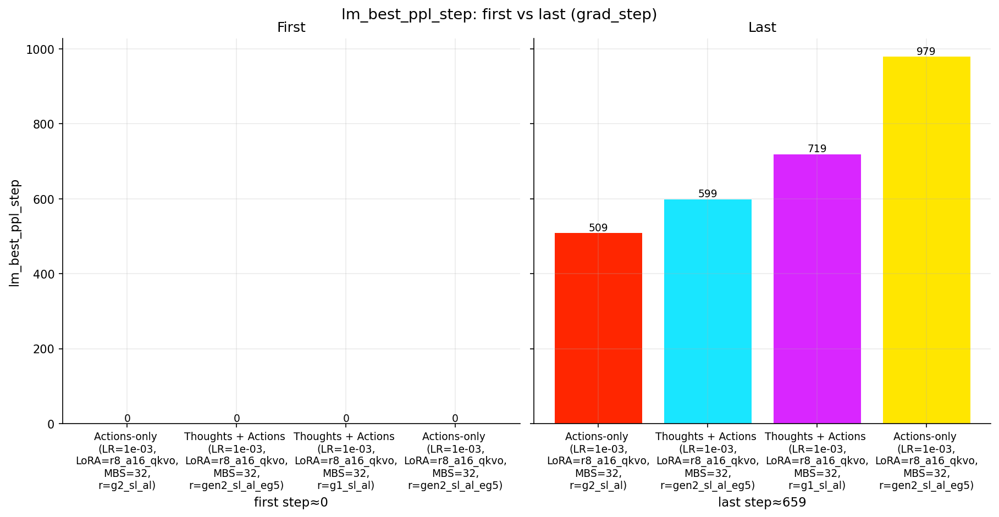

In [ ]:
import numpy as np

# base = join(LOG_DIR, "act_lm_snorkel_finance_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_coin", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_treasure", "Qwen3_4B_Instruct_2507")

base = join(LOG_DIR, "act_lm_tw_cooking_fsc_ms1_mt4k", "Qwen3_4B_Instruct_2507")


VALID_MODEL_CONFIG_MAP = {
    'hf_qwen3_4b_inst_2507': 'Qwen3_4B_Instruct_2507',
    'hf_qwen3_8b': 'Qwen3_8B'
}


verbose_labels = True

BARCHART_TYPE = "first"
FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        _model_config = str(p).split("-moco=")[-1].split("-")[0]
        if is_valid_metrics_file(p, kind) and (
            "lera=0_001" in str(p)
            and VALID_MODEL_CONFIG_MAP[_model_config] in str(p)
        ):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)
            # print(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files[FILE_KIND][0], lines=True)
display(df.head())

ignore_cols = ['eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step']
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    print(n_cool, n_warm)
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    marker_idx = 0

    # ---- NEW: collect first values (and first steps if you want to print them) ----
    first_vals = []
    first_steps = []
    last_vals = []
    last_steps = []
    bar_colors = []

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        print("Loading data from", fname)

        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception:
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        df[v] = df[k]
                    elif v in df.columns:
                        df[k] = df[v]
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print(f"Failed to prepare df for {fname}: {e}")
                continue

        label = labels[_idx]
        color = get_color(label)
        marker_style_dict = marker_style_for(label, color)

        # label = label.replace("(", "\n(").replace(", ", ",\n")

        # Line plot
        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=color,
            alpha=0.7,
            **marker_style_dict,
        )
        marker_idx += 1

        # ---- NEW: first value extraction ----
        if len(_df) > 0 and (y_label in _df.columns) and (x_label in _df.columns):
            first_steps.append(float(_df[x_label].iloc[0]))
            first_vals.append(float(_df[y_label].iloc[0]))
            # Also get last values
            last_steps.append(float(_df[x_label].iloc[-1]))
            last_vals.append(float(_df[y_label].iloc[-1]))
            
            # bar_colors.append(get_color(label))  # use same palette logic per label
            bar_colors.append(color)
        else:
            first_steps.append(np.nan)
            first_vals.append(np.nan)
            last_steps.append(np.nan)
            last_vals.append(np.nan)
            # bar_colors.append(get_color(label))
            bar_colors.append(color)
    # Finish line plot
    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    y_anchor = -len(labels) * 0.1
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),
        ncol=1,
        frameon=True,
    )
    plt.show()
    plt.close()

    # ---- NEW: bar charts of first + last values side-by-side ----
    keep = [i for i, v in enumerate(first_vals) if np.isfinite(v) and np.isfinite(last_vals[i])]
    if len(keep) == 0:
        continue

    # Sort consistently (I usually sort by LAST so it's easy to see who ends best)
    order = sorted(keep, key=lambda i: last_vals[i])

    x = np.arange(len(order))

    first_plot_vals = [first_vals[i] for i in order]
    last_plot_vals  = [last_vals[i] for i in order]
    first_plot_steps = [first_steps[i] for i in order]
    last_plot_steps  = [last_steps[i] for i in order]

    lbls = [labels[i] for i in order]
    cols = [bar_colors[i] for i in order]

    # Optional: split labels across multiple lines
    lbls = [lbl.replace("(", "\n(").replace(", ", ",\n") for lbl in lbls]

    fig, (ax0, ax1) = plt.subplots(
        nrows=1, ncols=2,
        # figsize=(12, 4),
        figsize=(12, 6),
        sharey=True,             # important for fair comparison
        constrained_layout=True  # nicer than tight_layout for multi-axes
    )

    # --- First bars ---
    ax0.bar(x, first_plot_vals, color=cols)
    ax0.set_title("First")
    ax0.set_ylabel(key.replace("eval/", ""))
    ax0.set_xticks(x)
    ax0.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, first_plot_vals, first_plot_steps):
        ax0.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show first step under bars
    ax0.set_xlabel(f"first step≈{np.nanmedian(first_plot_steps):.0f}")

    # --- Last bars ---
    ax1.bar(x, last_plot_vals, color=cols)
    ax1.set_title("Last")
    ax1.set_xticks(x)
    ax1.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, last_plot_vals, last_plot_steps):
        ax1.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show last step under bars
    ax1.set_xlabel(f"last step≈{np.nanmedian(last_plot_steps):.0f}")

    fig.suptitle(f"{key.replace('eval/', '')}: first vs last (grad_step)", y=1.02)

    plt.show()
    plt.close(fig)


In [39]:
import json
# from rich import print as rich_print

env_and_model_configs = {}

for root, _dirs, files in os.walk(LOG_DIR):
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        else:
            root_str = str(root)
            root_str_parts = root_str.split("/")
            for _idx, subdir in enumerate(root_str_parts):
                if subdir.startswith("act_lm_"):
                    if subdir not in env_and_model_configs:
                        env_and_model_configs[subdir] = {"model": []}
                    _model = root_str_parts[_idx + 1]
                    if _model not in env_and_model_configs[subdir]["model"]:
                        env_and_model_configs[subdir]["model"].append(_model)
                    # break

print(json.dumps(env_and_model_configs, indent=2))

{
  "act_lm_tw_cooking_fsc_ms1_mt20": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_tw_treasure_tt": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k": {
    "model": [
      "Qwen3_8B",
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_taubench_airline_gt": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_browsecomp_gt_mt8k": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_tw_cooking_fsc_ms1_mt10": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_tw_coin": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_taubench_airline_gt_mt4k": {
    "model": [
      "Qwen3_8B",
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_snorkel_finance_aprm_fs1_15": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_snorkel_insurance_gt": {
    "model": [
      "Qwen3_4B_Instruct_2507"
    ]
  },
  "act_lm_snorkel_finance_pt

In [46]:
valid_metrics_files

{}

In [ ]:
# names

['acon=NA-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=NA-re=g1_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k',
 'acon=NA-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=NA-re=gen2_sl_al_eg5_act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k',
 'acon=NA-enco=act_lm_taubench_airline_gt_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=Qwen3_4B_Instruct_2507-re=gen1_sl_al_act_lm_taubench_airline_gt_mt4k',
 'acon=1-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=NA-re=g2_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k',
 'acon=1-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=NA-re=gen2_sl_al_eg5_act_lm_tau_airline_aprm500_lr4e5

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,actions_data_lm_save_path,train/loss,train/ppl,train/weight,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path
0,0,0,0.688756,0.252792,0.0,0.0,1.991236,0.502201,1.991236,0.0,./logs/act_lm_snorkel_finance_pt_aprm_fs1_19_m...,1.101562,3.015625,0.776168,NaN,NaN,NaN,NaN
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.265625,3.546875,0.742976,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.234375,3.437500,0.693646,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.894531,2.453125,0.999978,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.281250,3.593750,0.947173,NaN,NaN,NaN,NaN


4 5
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen1_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa

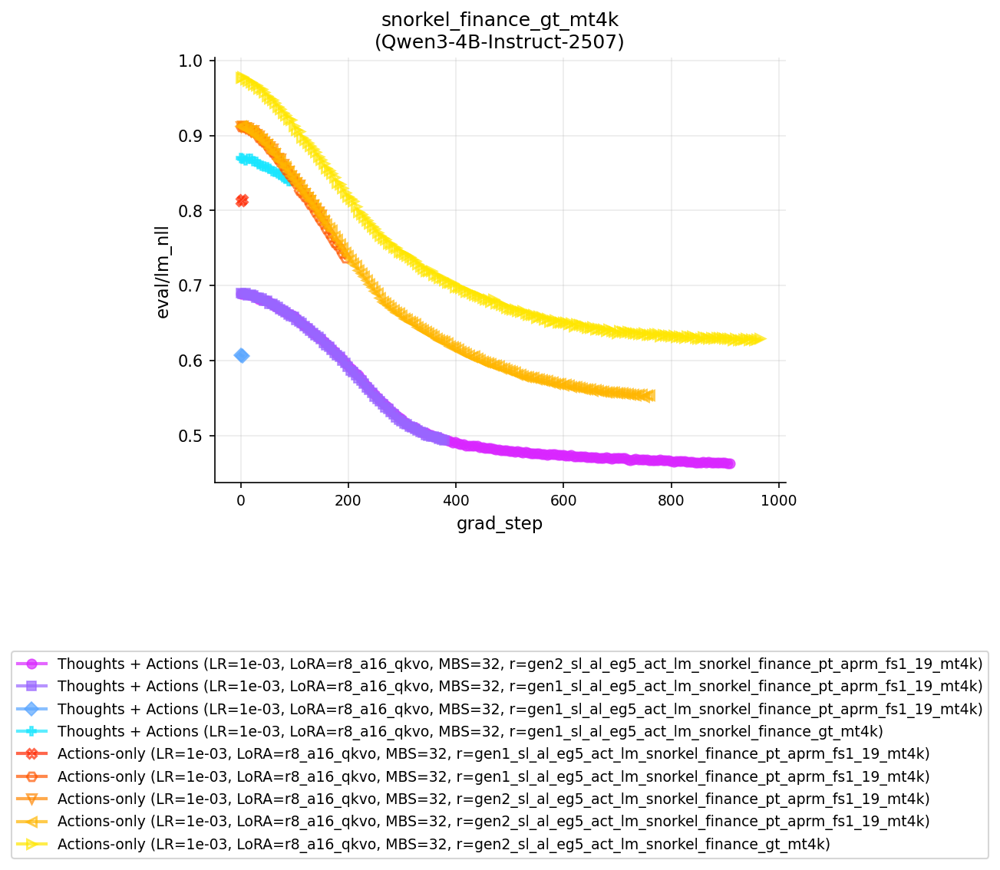

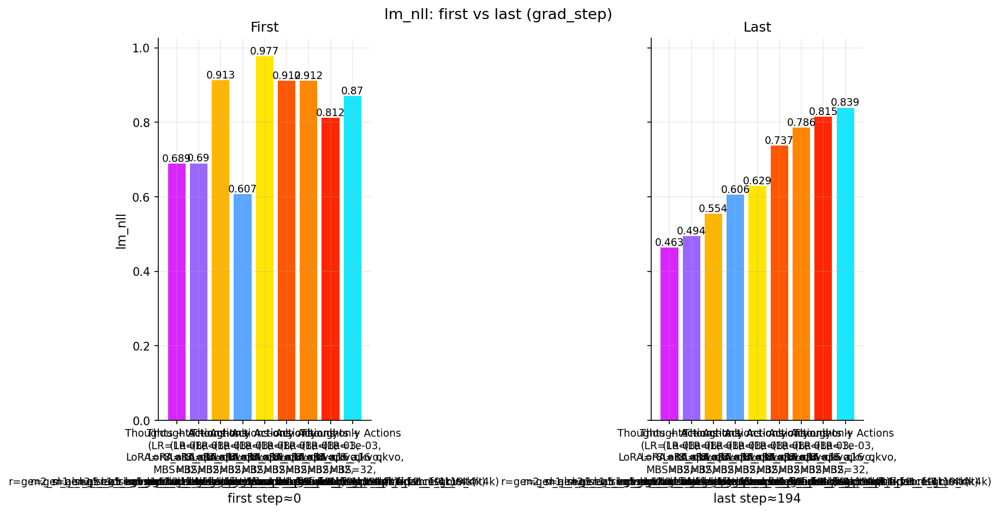

4 5
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen1_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa

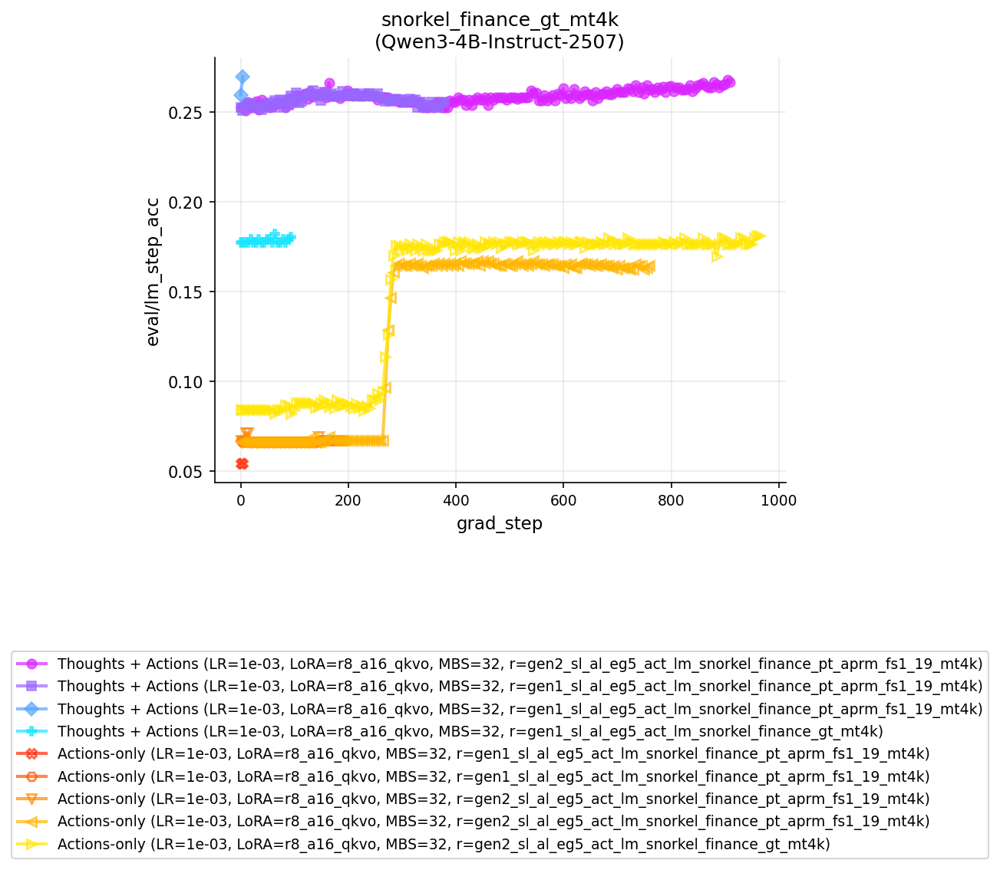

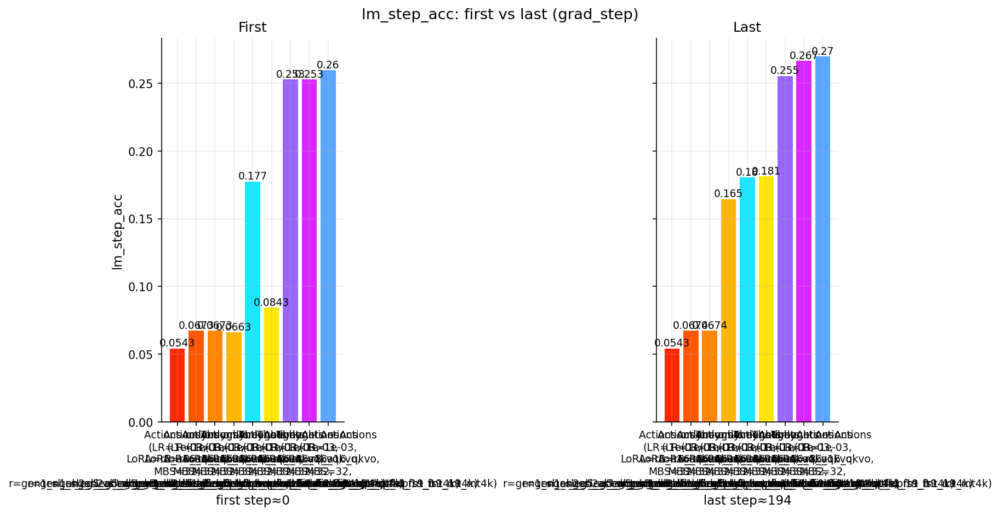

4 5
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen1_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa

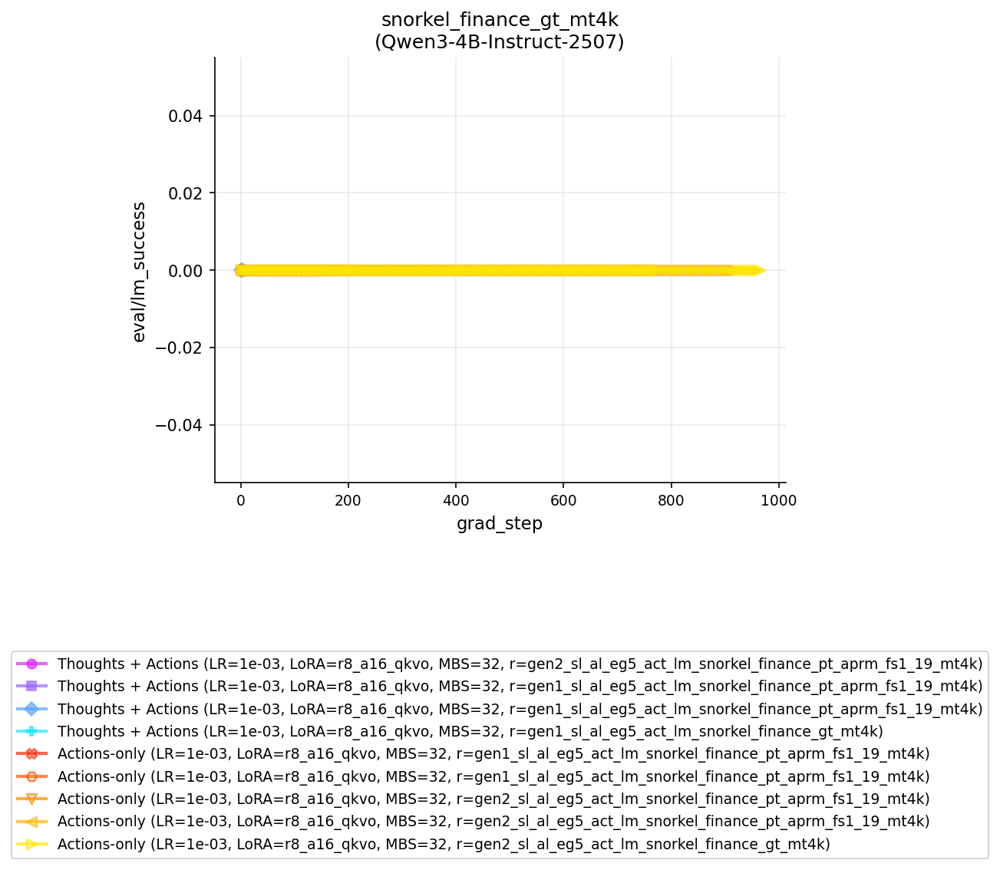

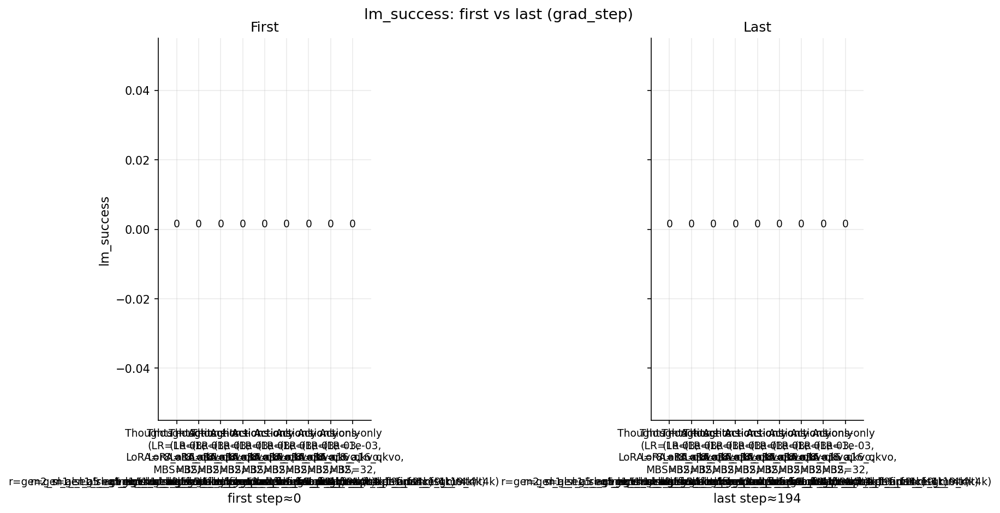

4 5
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen1_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa

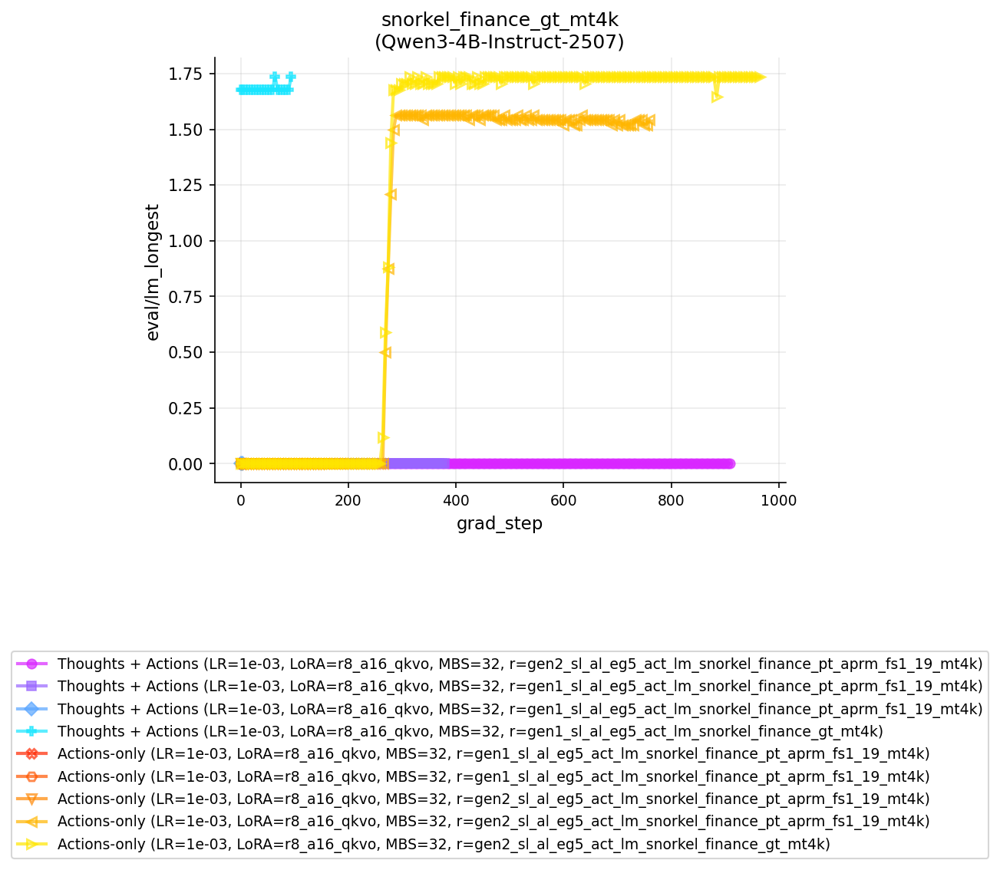

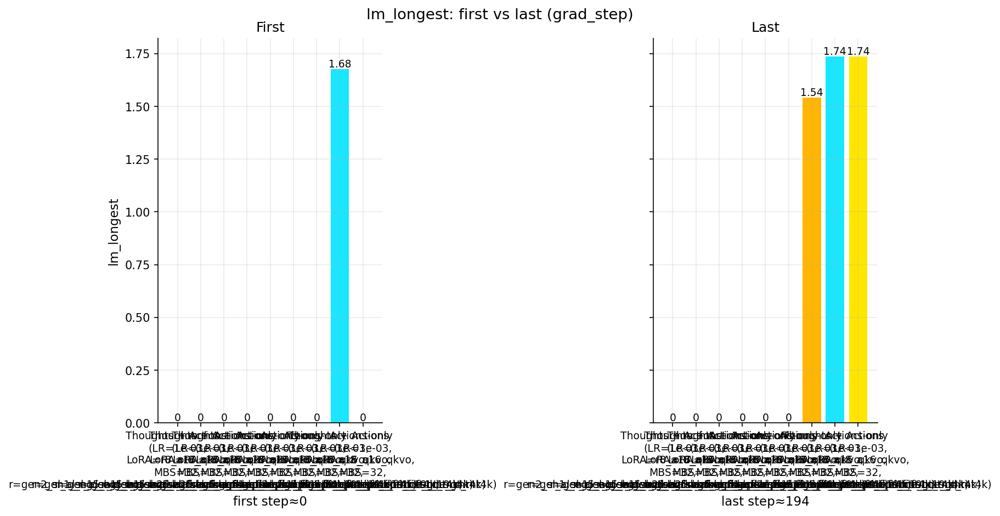

4 5
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen1_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa

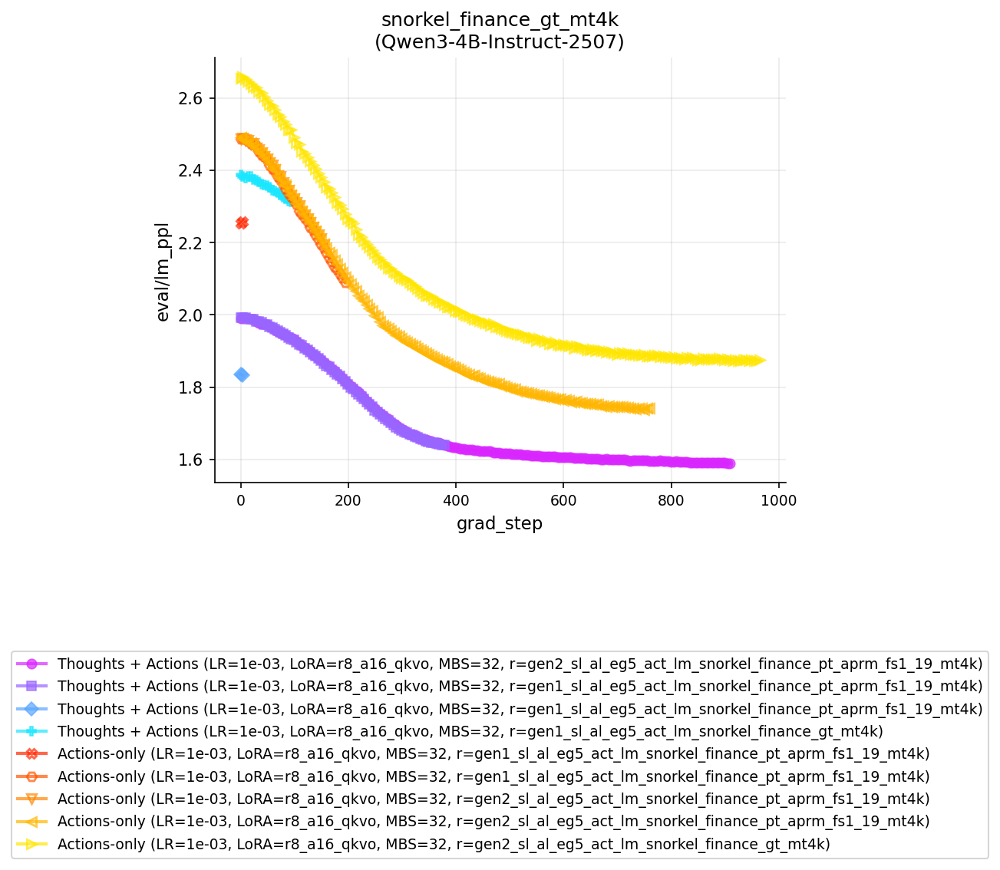

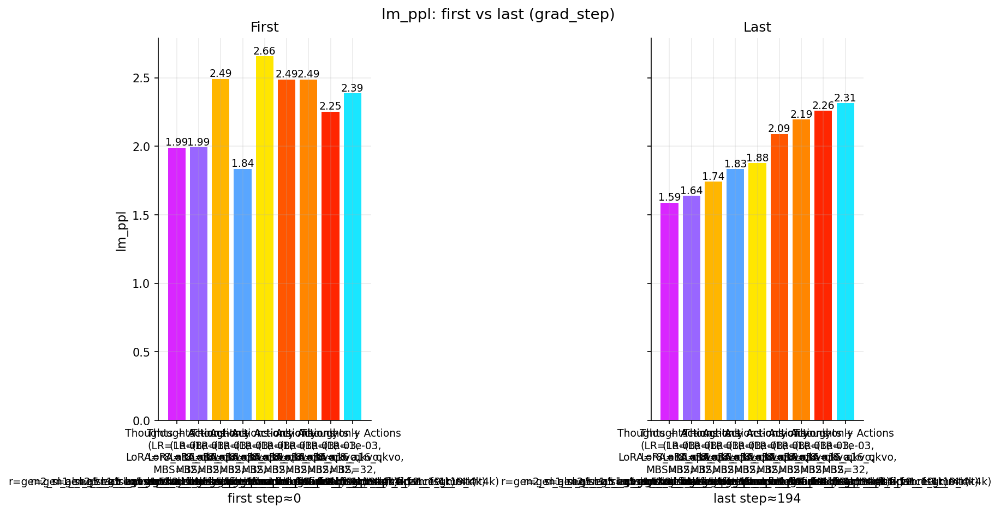

4 5
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen2_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa=100-se=0-re=gen1_sl_al_eg5/metrics.jsonl
Loading data from ../logs/act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-nuevgesa

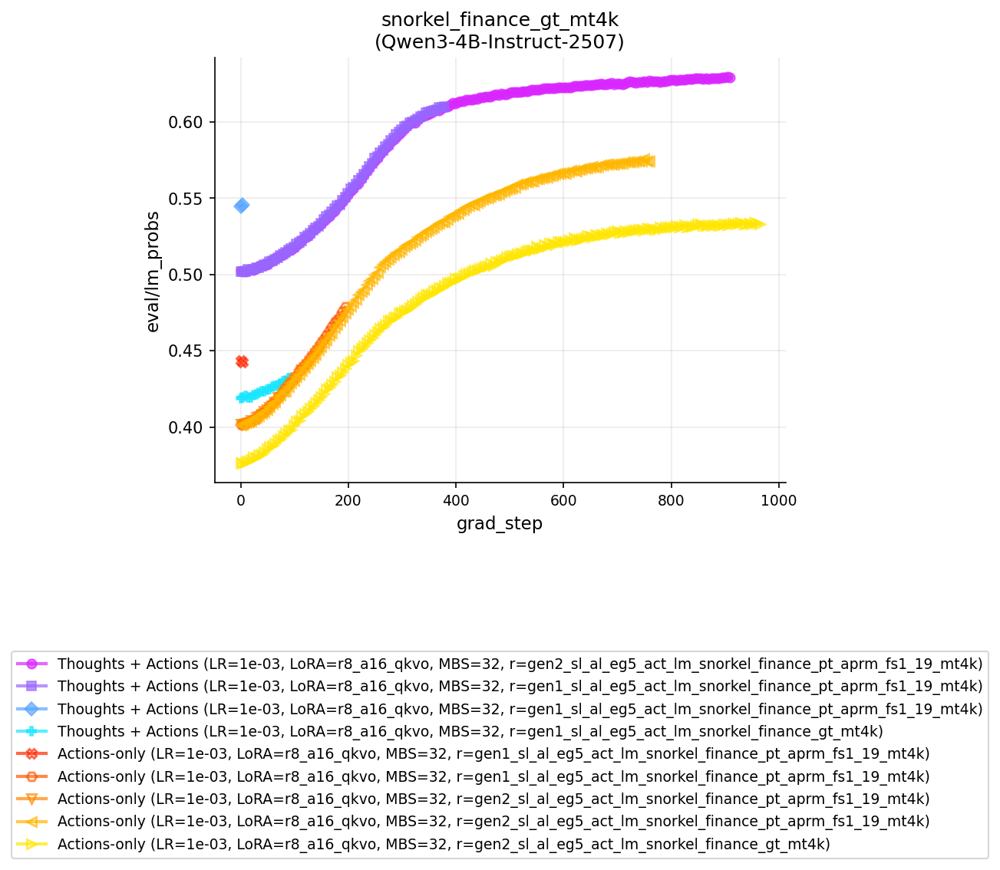

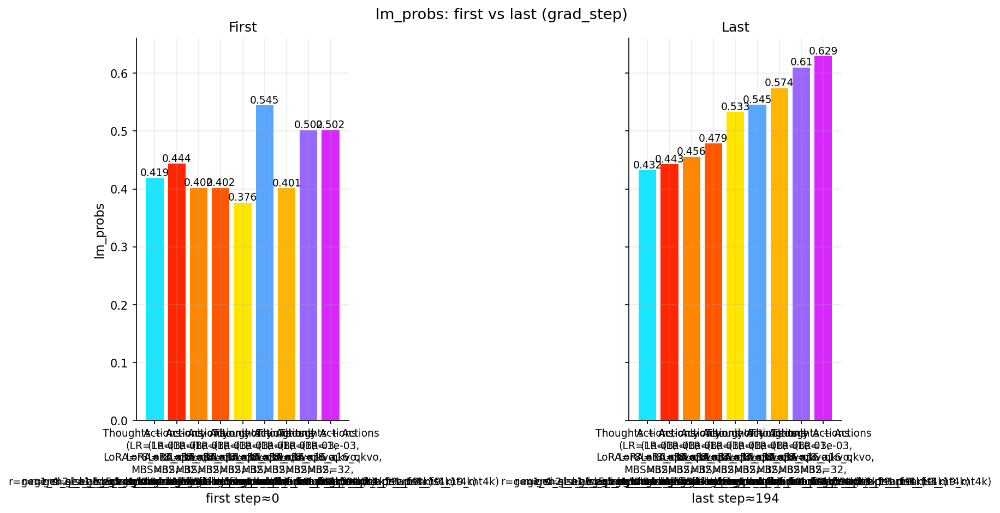

In [ ]:
import numpy as np

# base = join(LOG_DIR, "act_lm_snorkel_finance_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_snorkel_finance_gt", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_4B_Instruct_2507")
base = join(LOG_DIR)  # , "act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k", "Qwen3_4B_Instruct_2507")

# ENV_NAMES = [
#     "act_lm_taubench_retail_gt_mt4k",
#     "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k",
# ]
ENV_NAMES = [
    "act_lm_snorkel_finance_gt_mt4k",
    "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k",
]
MODEL_NAMES = ["Qwen3_4B_Instruct_2507"]


# base = join(LOG_DIR, "act_lm_tw_coin", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_treasure", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_cooking_fsc_ms1_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")


VALID_MODEL_CONFIG_MAP = {
    'hf_qwen3_4b_inst_2507': 'Qwen3_4B_Instruct_2507',
    'hf_qwen3_8b': 'Qwen3_8B'
}

verbose_labels = True

BARCHART_TYPE = "first"
FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        _valid_path = False
        for env_name in ENV_NAMES:
            for model_name in MODEL_NAMES:
                if env_name in str(root) and model_name in str(root):
                    _valid_path = True
                    break
        if not _valid_path:
            continue
        
        if name not in files_set:
            continue
        p = Path(root) / name
        _model_config = str(p).split("-moco=")[-1].split("-")[0]
        if is_valid_metrics_file(p, kind) and (
            "lera=0_001" in str(p)
            and VALID_MODEL_CONFIG_MAP[_model_config] in str(p)
            and (("_tt" not in str(p) and "-nuevgesa=10-" not in str(p)) or ("finance" not in str(p)))
            # and "-nuevgesa=10-" not in str(p)
        ):

        
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)
            # print(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files[FILE_KIND][0], lines=True)
display(df.head())

ignore_cols = [
    'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step',
]
ignore_cols.extend(
    ['rollout_eval_eval/try_0/final_reward', 'rollout_eval_eval/try_0/final_reward_std', 'rollout_eval_eval/try_0/final_reward_max', 'rollout_eval_eval/try_0/first_return', 'rollout_eval_eval/try_0/first_return_std', 'rollout_eval_eval/try_0/first_return_max', 'rollout_eval_eval/try_0/action_prob', 'rollout_eval_eval/try_0/action_prob_std', 'rollout_eval_eval/try_0/action_prob_max', 'rollout_eval_eval/try_0/last_state_len', 'rollout_eval_eval/try_0/last_state_len_std', 'rollout_eval_eval/try_0/last_state_len_max', 'rollout_eval_eval/try_0/timesteps', 'rollout_eval_eval/try_0/timesteps_std', 'rollout_eval_eval/try_0/timesteps_max', 'rollout_eval_eval/try_0/correct', 'rollout_eval_eval/try_0/correct_std', 'rollout_eval_eval/try_0/correct_max', 'rollout_eval_eval/try_0/total', 'rollout_eval_eval/try_0/total_std', 'rollout_eval_eval/try_0/total_max', 'rollout_eval_eval/try_0/accuracy', 'eval/ro_rollout_eval_eval/try_0/final_reward', 'eval/ro_rollout_eval_eval/try_0/final_reward_best', 'eval/ro_rollout_eval_eval/try_0/final_reward_best_step']
)
ignore_cols.extend(
    ['eval/lm_best_ppl', 'eval/lm_best_ppl_step']
)

eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    # names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])
    names = [
        f"{str(_name).split("/")[-2]}_{str(_name).split("/")[2].replace("-", "_")}"
        for _name in valid_metrics_files[FILE_KIND]
    ]
    names = unique_ids_from_strings(names)

    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    print(n_cool, n_warm)
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    marker_idx = 0

    # ---- NEW: collect first values (and first steps if you want to print them) ----
    first_vals = []
    first_steps = []
    last_vals = []
    last_steps = []
    bar_colors = []

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        print("Loading data from", fname)

        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception:
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        df[v] = df[k]
                    elif v in df.columns:
                        df[k] = df[v]
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print(f"Failed to prepare df for {fname}: {e}")
                continue

        label = labels[_idx]
        color = get_color(label)
        marker_style_dict = marker_style_for(label, color)

        # label = label.replace("(", "\n(").replace(", ", ",\n")

        # Line plot
        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=color,
            alpha=0.7,
            **marker_style_dict,
        )
        marker_idx += 1

        # ---- NEW: first value extraction ----
        if len(_df) > 0 and (y_label in _df.columns) and (x_label in _df.columns):
            first_steps.append(float(_df[x_label].iloc[0]))
            first_vals.append(float(_df[y_label].iloc[0]))
            # Also get last values
            last_steps.append(float(_df[x_label].iloc[-1]))
            last_vals.append(float(_df[y_label].iloc[-1]))
            
            # bar_colors.append(get_color(label))  # use same palette logic per label
            bar_colors.append(color)
        else:
            first_steps.append(np.nan)
            first_vals.append(np.nan)
            last_steps.append(np.nan)
            last_vals.append(np.nan)
            # bar_colors.append(get_color(label))
            bar_colors.append(color)
    # Finish line plot
    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    y_anchor = -len(labels) * 0.1
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),
        ncol=1,
        frameon=True,
    )
    plt.show()
    plt.close()

    # ---- NEW: bar charts of first + last values side-by-side ----
    keep = [i for i, v in enumerate(first_vals) if np.isfinite(v) and np.isfinite(last_vals[i])]
    if len(keep) == 0:
        continue

    # Sort consistently (I usually sort by LAST so it's easy to see who ends best)
    order = sorted(keep, key=lambda i: last_vals[i])

    x = np.arange(len(order))

    first_plot_vals = [first_vals[i] for i in order]
    last_plot_vals  = [last_vals[i] for i in order]
    first_plot_steps = [first_steps[i] for i in order]
    last_plot_steps  = [last_steps[i] for i in order]

    lbls = [labels[i] for i in order]
    cols = [bar_colors[i] for i in order]

    # Optional: split labels across multiple lines
    lbls = [lbl.replace("(", "\n(").replace(", ", ",\n") for lbl in lbls]

    fig, (ax0, ax1) = plt.subplots(
        nrows=1, ncols=2,
        # figsize=(12, 4),
        figsize=(12, 6),
        sharey=True,             # important for fair comparison
        constrained_layout=True  # nicer than tight_layout for multi-axes
    )

    # --- First bars ---
    ax0.bar(x, first_plot_vals, color=cols)
    ax0.set_title("First")
    ax0.set_ylabel(key.replace("eval/", ""))
    ax0.set_xticks(x)
    ax0.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, first_plot_vals, first_plot_steps):
        ax0.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show first step under bars
    ax0.set_xlabel(f"first step≈{np.nanmedian(first_plot_steps):.0f}")

    # --- Last bars ---
    ax1.bar(x, last_plot_vals, color=cols)
    ax1.set_title("Last")
    ax1.set_xticks(x)
    ax1.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, last_plot_vals, last_plot_steps):
        ax1.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show last step under bars
    ax1.set_xlabel(f"last step≈{np.nanmedian(last_plot_steps):.0f}")

    fig.suptitle(f"{key.replace('eval/', '')}: first vs last (grad_step)", y=1.02)

    plt.show()
    plt.close(fig)


,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,actions_data_lm_save_path,train/loss,train/ppl,train/weight,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path
0,0,0,0.843078,0.200016,0.0,0.0,2.323509,0.430384,2.323509,0.0,./logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b0...,1.414062,4.125000,0.191207,NaN,NaN,NaN,NaN
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.406250,4.093750,0.568101,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.468750,4.343750,0.795116,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.312500,3.718750,0.551546,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.375000,3.953125,0.432248,NaN,NaN,NaN,NaN


Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_taubench_airline_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al_act_lm_taubench_airline_gt_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b

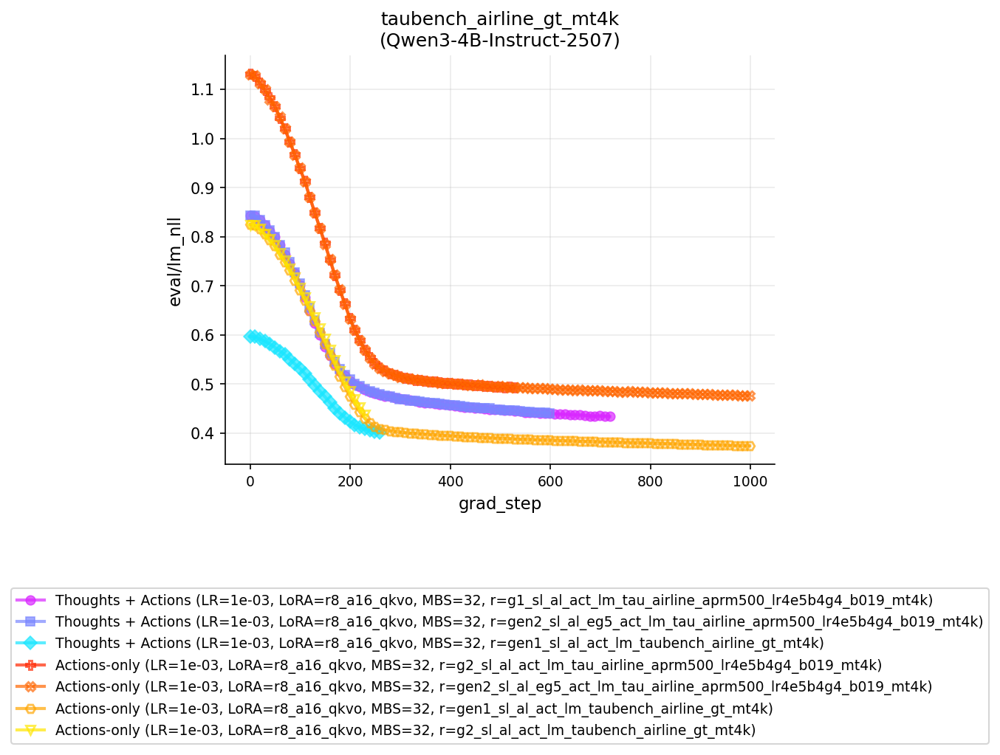

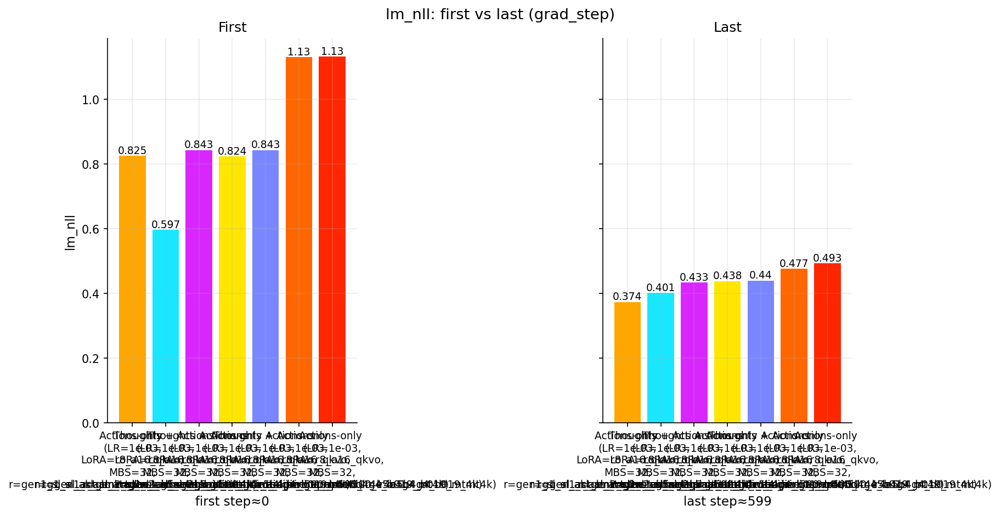

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_taubench_airline_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al_act_lm_taubench_airline_gt_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b

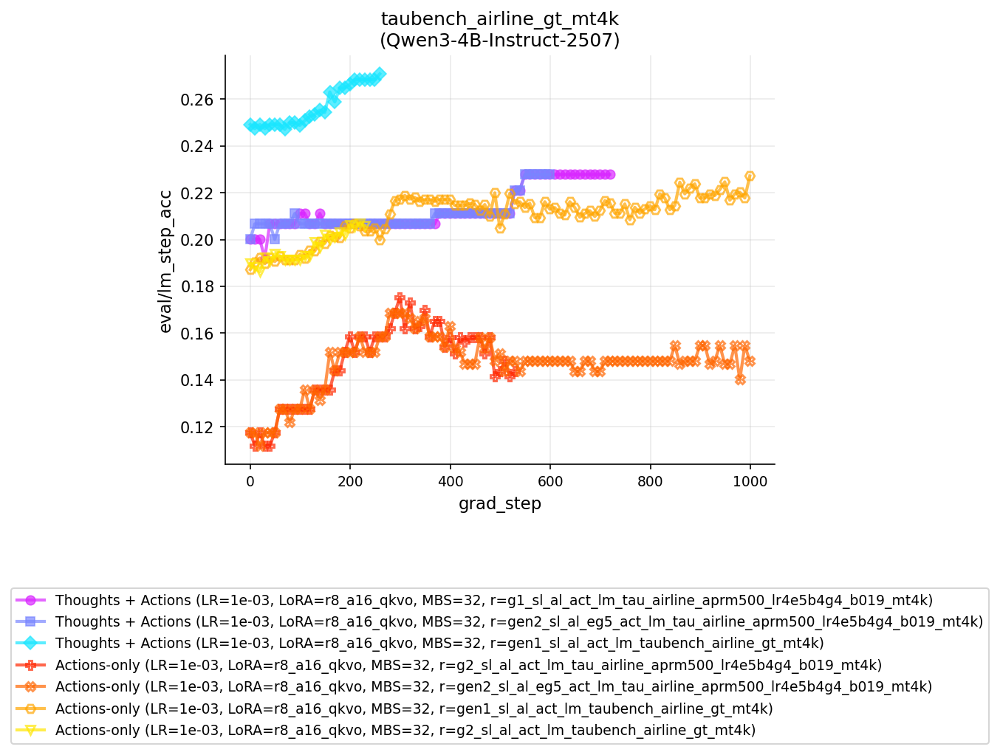

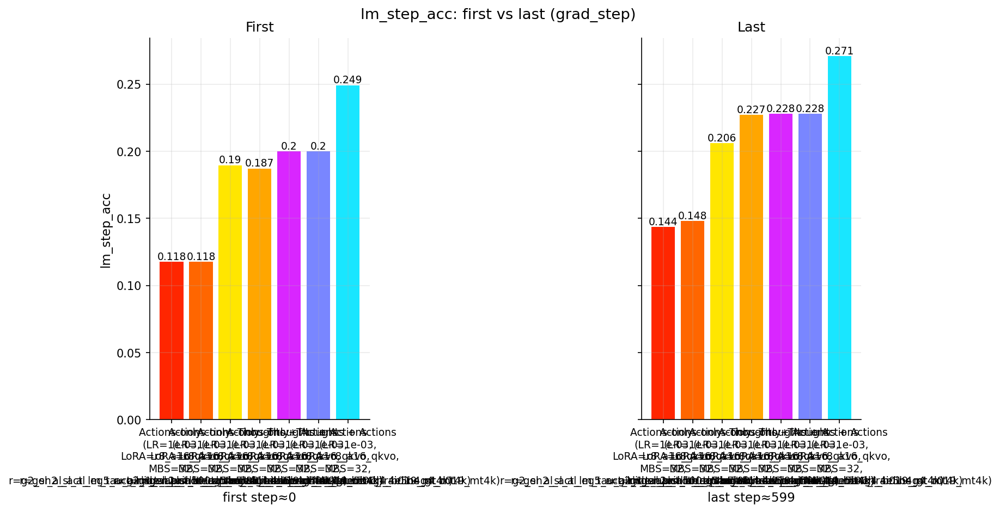

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_taubench_airline_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al_act_lm_taubench_airline_gt_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b

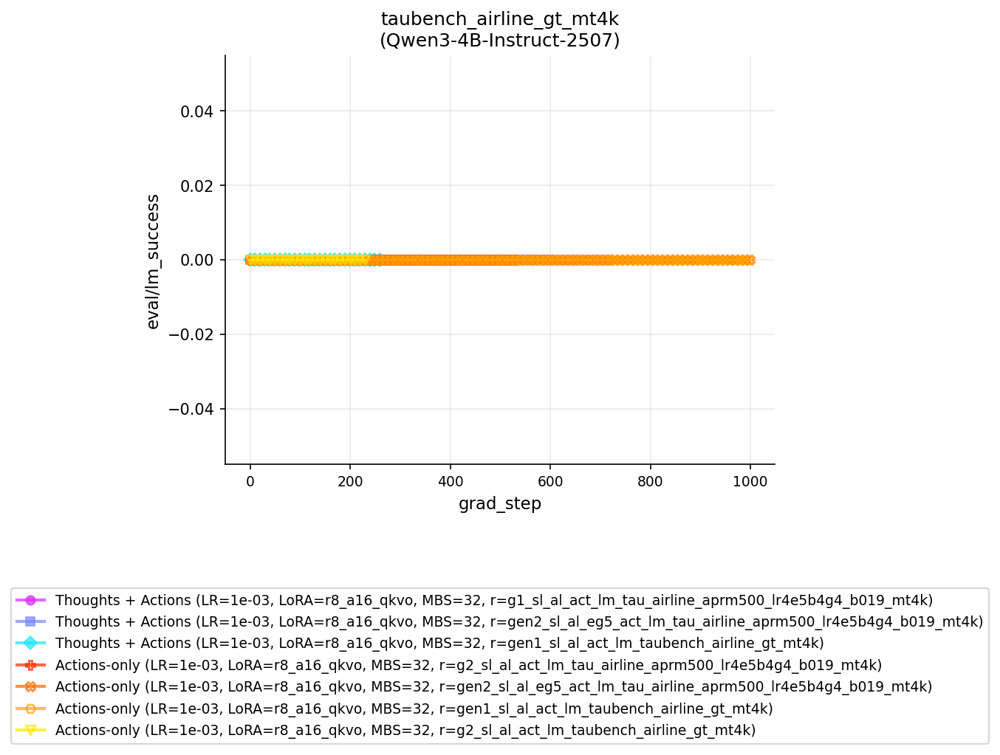

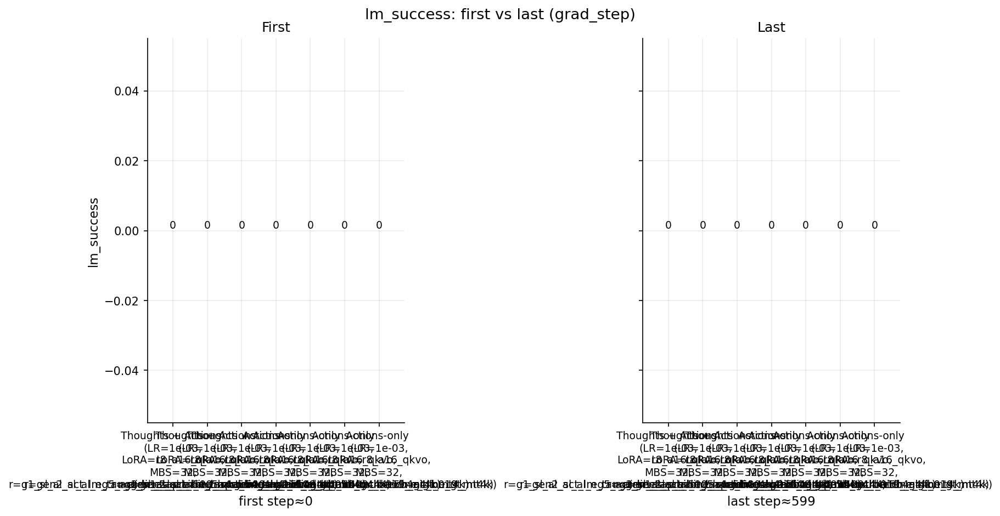

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_taubench_airline_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al_act_lm_taubench_airline_gt_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b

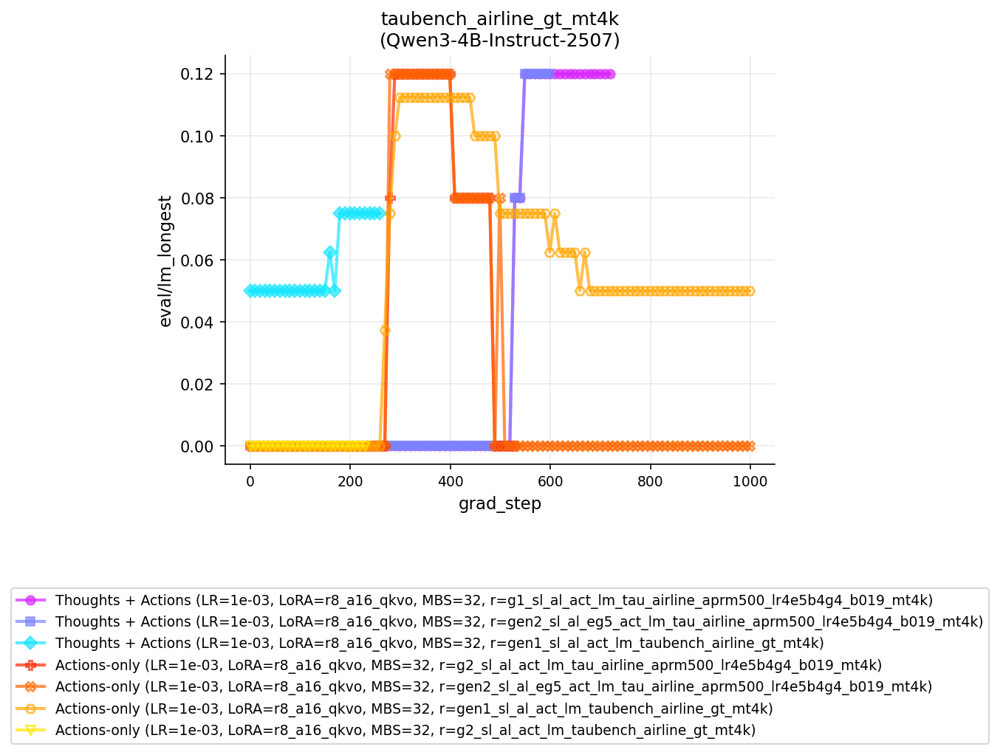

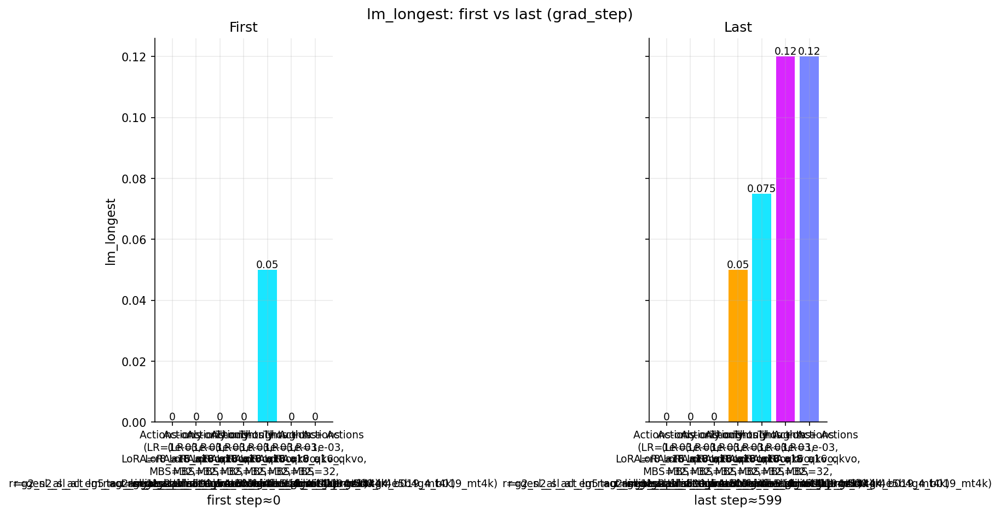

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_taubench_airline_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al_act_lm_taubench_airline_gt_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b

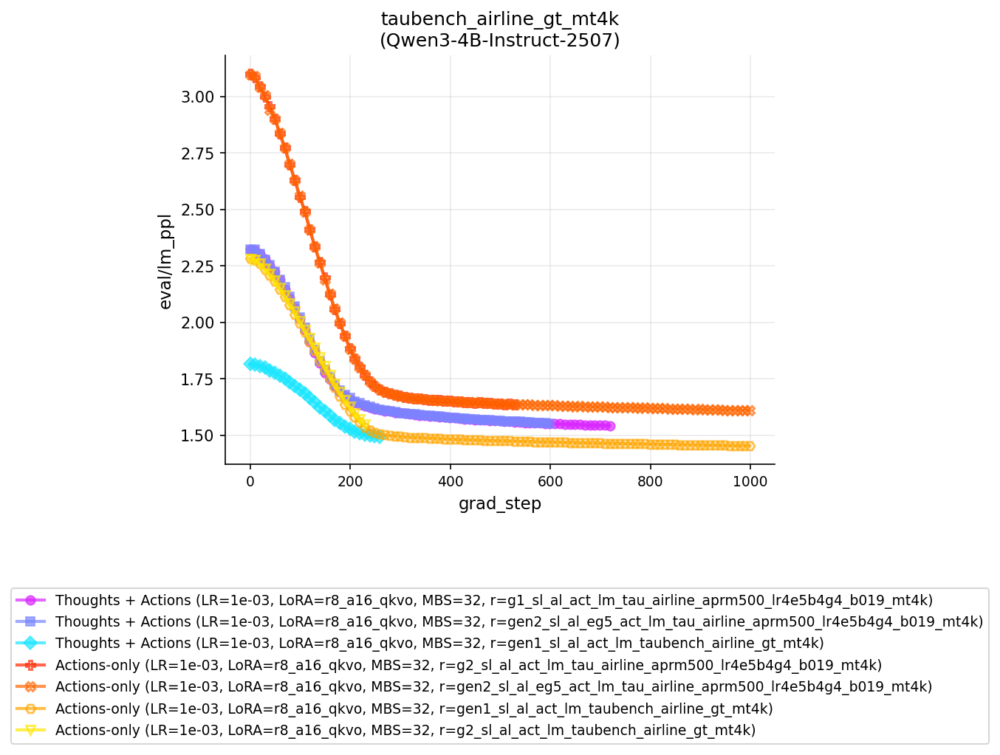

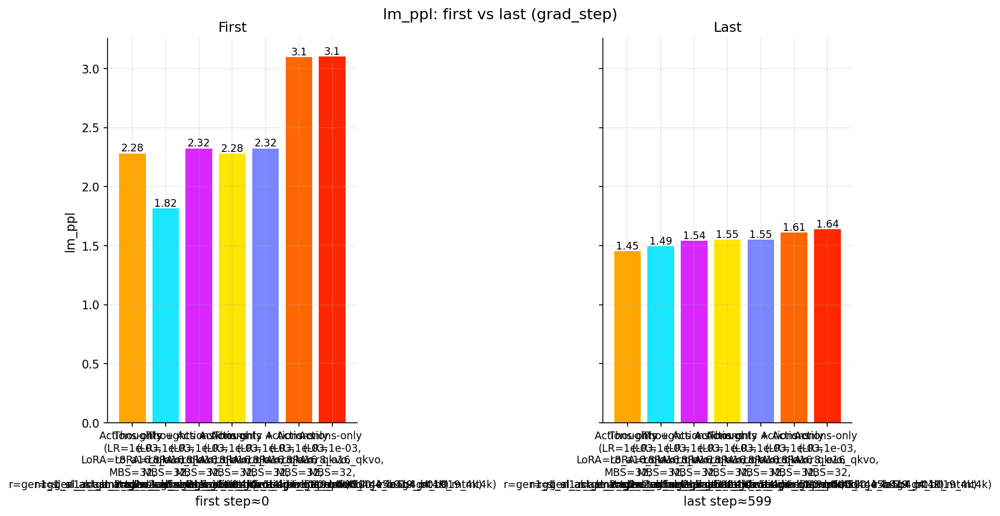

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5_act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_taubench_airline_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al_act_lm_taubench_airline_gt_mt4k
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al_act_lm_tau_airline_aprm500_lr4e5b4g4_b

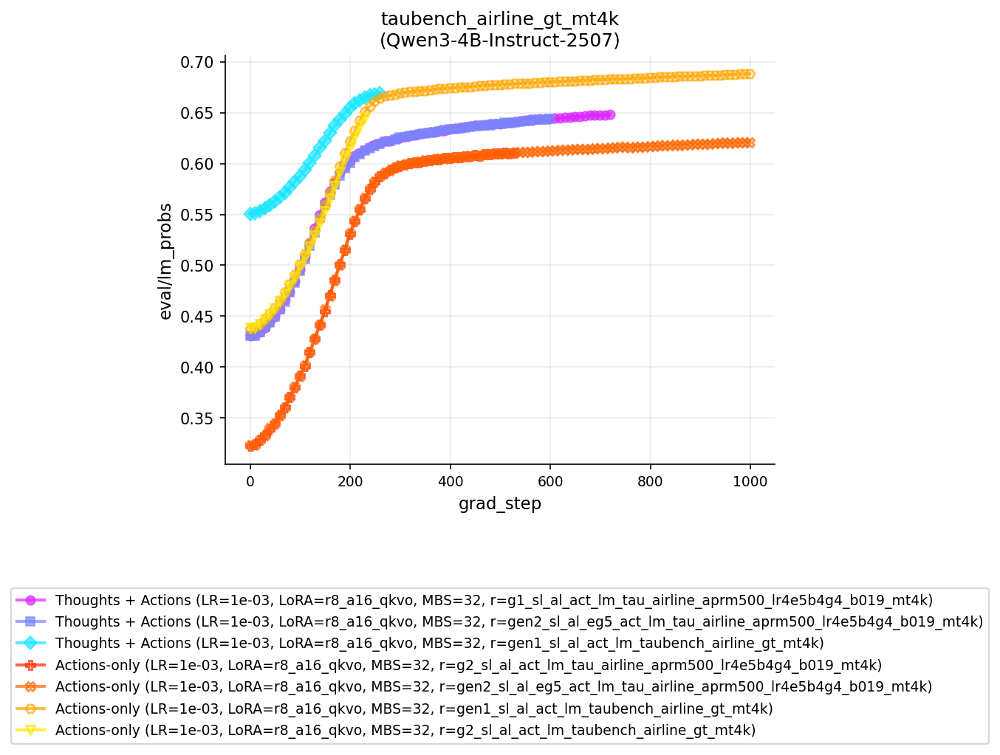

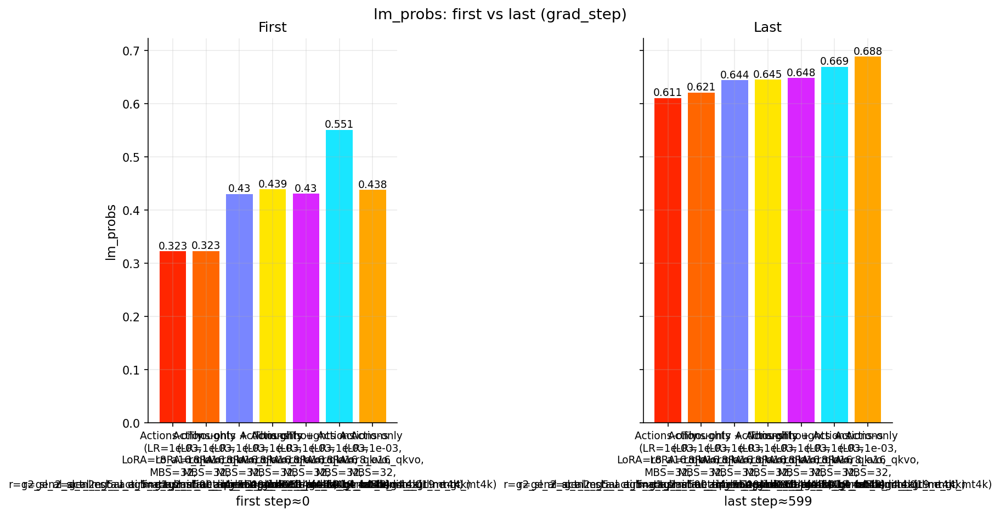

In [67]:
import numpy as np

# base = join(LOG_DIR, "act_lm_snorkel_finance_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_snorkel_finance_gt", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_4B_Instruct_2507")
base = join(LOG_DIR)  # , "act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k", "Qwen3_4B_Instruct_2507")

ENV_NAMES = [
    "act_lm_taubench_airline_gt_mt4k",
    "act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k",
]
MODEL_NAMES = ["Qwen3_4B_Instruct_2507"]


# base = join(LOG_DIR, "act_lm_tw_coin", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_treasure", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_cooking_fsc_ms1_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")


VALID_MODEL_CONFIG_MAP = {
    'hf_qwen3_4b_inst_2507': 'Qwen3_4B_Instruct_2507',
    'hf_qwen3_8b': 'Qwen3_8B'
}

verbose_labels = True

BARCHART_TYPE = "first"
FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        _valid_path = False
        for env_name in ENV_NAMES:
            for model_name in MODEL_NAMES:
                if env_name in str(root) and model_name in str(root):
                    _valid_path = True
                    break
        if not _valid_path:
            continue
        
        if name not in files_set:
            continue
        p = Path(root) / name
        _model_config = str(p).split("-moco=")[-1].split("-")[0]
        if is_valid_metrics_file(p, kind) and (
            "lera=0_001" in str(p)
            and VALID_MODEL_CONFIG_MAP[_model_config] in str(p)
            # and "-nuevgesa=10-" not in str(p)
        ):

        
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)
            # print(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files[FILE_KIND][0], lines=True)
display(df.head())

ignore_cols = [
    'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step',
]
ignore_cols.extend(
    ['rollout_eval_eval/try_0/final_reward', 'rollout_eval_eval/try_0/final_reward_std', 'rollout_eval_eval/try_0/final_reward_max', 'rollout_eval_eval/try_0/first_return', 'rollout_eval_eval/try_0/first_return_std', 'rollout_eval_eval/try_0/first_return_max', 'rollout_eval_eval/try_0/action_prob', 'rollout_eval_eval/try_0/action_prob_std', 'rollout_eval_eval/try_0/action_prob_max', 'rollout_eval_eval/try_0/last_state_len', 'rollout_eval_eval/try_0/last_state_len_std', 'rollout_eval_eval/try_0/last_state_len_max', 'rollout_eval_eval/try_0/timesteps', 'rollout_eval_eval/try_0/timesteps_std', 'rollout_eval_eval/try_0/timesteps_max', 'rollout_eval_eval/try_0/correct', 'rollout_eval_eval/try_0/correct_std', 'rollout_eval_eval/try_0/correct_max', 'rollout_eval_eval/try_0/total', 'rollout_eval_eval/try_0/total_std', 'rollout_eval_eval/try_0/total_max', 'rollout_eval_eval/try_0/accuracy', 'eval/ro_rollout_eval_eval/try_0/final_reward', 'eval/ro_rollout_eval_eval/try_0/final_reward_best', 'eval/ro_rollout_eval_eval/try_0/final_reward_best_step']
)
ignore_cols.extend(
    ['eval/lm_best_ppl', 'eval/lm_best_ppl_step']
)

eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    # names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])
    names = [
        f"{str(_name).split("/")[-2]}_{str(_name).split("/")[2].replace("-", "_")}"
        for _name in valid_metrics_files[FILE_KIND]
    ]
    names = unique_ids_from_strings(names)

    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    print(n_cool, n_warm)
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    marker_idx = 0

    # ---- NEW: collect first values (and first steps if you want to print them) ----
    first_vals = []
    first_steps = []
    last_vals = []
    last_steps = []
    bar_colors = []

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        print("Loading data from", fname)

        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception:
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        df[v] = df[k]
                    elif v in df.columns:
                        df[k] = df[v]
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print(f"Failed to prepare df for {fname}: {e}")
                continue

        label = labels[_idx]
        color = get_color(label)
        marker_style_dict = marker_style_for(label, color)

        # label = label.replace("(", "\n(").replace(", ", ",\n")

        # Line plot
        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=color,
            alpha=0.7,
            **marker_style_dict,
        )
        marker_idx += 1

        # ---- NEW: first value extraction ----
        if len(_df) > 0 and (y_label in _df.columns) and (x_label in _df.columns):
            first_steps.append(float(_df[x_label].iloc[0]))
            first_vals.append(float(_df[y_label].iloc[0]))
            # Also get last values
            last_steps.append(float(_df[x_label].iloc[-1]))
            last_vals.append(float(_df[y_label].iloc[-1]))
            
            # bar_colors.append(get_color(label))  # use same palette logic per label
            bar_colors.append(color)
        else:
            first_steps.append(np.nan)
            first_vals.append(np.nan)
            last_steps.append(np.nan)
            last_vals.append(np.nan)
            # bar_colors.append(get_color(label))
            bar_colors.append(color)
    # Finish line plot
    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    y_anchor = -len(labels) * 0.1
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),
        ncol=1,
        frameon=True,
    )
    plt.show()
    plt.close()

    # ---- NEW: bar charts of first + last values side-by-side ----
    keep = [i for i, v in enumerate(first_vals) if np.isfinite(v) and np.isfinite(last_vals[i])]
    if len(keep) == 0:
        continue

    # Sort consistently (I usually sort by LAST so it's easy to see who ends best)
    order = sorted(keep, key=lambda i: last_vals[i])

    x = np.arange(len(order))

    first_plot_vals = [first_vals[i] for i in order]
    last_plot_vals  = [last_vals[i] for i in order]
    first_plot_steps = [first_steps[i] for i in order]
    last_plot_steps  = [last_steps[i] for i in order]

    lbls = [labels[i] for i in order]
    cols = [bar_colors[i] for i in order]

    # Optional: split labels across multiple lines
    lbls = [lbl.replace("(", "\n(").replace(", ", ",\n") for lbl in lbls]

    fig, (ax0, ax1) = plt.subplots(
        nrows=1, ncols=2,
        # figsize=(12, 4),
        figsize=(12, 6),
        sharey=True,             # important for fair comparison
        constrained_layout=True  # nicer than tight_layout for multi-axes
    )

    # --- First bars ---
    ax0.bar(x, first_plot_vals, color=cols)
    ax0.set_title("First")
    ax0.set_ylabel(key.replace("eval/", ""))
    ax0.set_xticks(x)
    ax0.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, first_plot_vals, first_plot_steps):
        ax0.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show first step under bars
    ax0.set_xlabel(f"first step≈{np.nanmedian(first_plot_steps):.0f}")

    # --- Last bars ---
    ax1.bar(x, last_plot_vals, color=cols)
    ax1.set_title("Last")
    ax1.set_xticks(x)
    ax1.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, last_plot_vals, last_plot_steps):
        ax1.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show last step under bars
    ax1.set_xlabel(f"last step≈{np.nanmedian(last_plot_steps):.0f}")

    fig.suptitle(f"{key.replace('eval/', '')}: first vs last (grad_step)", y=1.02)

    plt.show()
    plt.close(fig)


In [ ]:
# str(valid_metrics_files[FILE_KIND][0]).split("/")[-2]

'act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al'

In [58]:
valid_metrics_files[FILE_KIND]

[PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al/metrics.jsonl'),
 PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/metrics.jsonl'),
 PosixPath('../logs/act_lm_taubench_airline_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_taubench_airline_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/metrics.jsonl'),
 PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instru

In [57]:
names

['acon=NA-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=NA-re=g1_sl_al-act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k_Qwen3_4B_Instruct_2507_act',
 'acon=NA-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=NA-re=gen2_sl_al_eg5-act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k_Qwen3_4B_Instruct_2507_act',
 'acon=NA-enco=act_lm_taubench_airline_gt_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=Qwen3_4B_Instruct_2507-re=gen1_sl_al-act_lm_taubench_airline_gt_mt4k_Qwen3_4B_Instruct_2507_act',
 'acon=1-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-hiob=1-lera=0_001-loco=r8_a16_qkvo-mibasi=32-moco=hf_qwen3_4b_inst_2507-mona=NA-re=g2_sl_al-act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k_Qwen3_4B_Instruct_2507_act',
 'acon=1-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-hiob=1-lera=0_001-loco

In [56]:
for n in names:
    # print(get_name_from_uid(n, verbose=True))
    print(n.split("-"))

['acon=NA', 'enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k', 'hiob=1', 'lera=0_001', 'loco=r8_a16_qkvo', 'mibasi=32', 'moco=hf_qwen3_4b_inst_2507', 'mona=NA', 're=g1_sl_al', 'act_lm_tau_airline_aprm500_lr4e5b4g4_b019', 'mt4k_Qwen3_4B_Instruct_2507_act']
['acon=NA', 'enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k', 'hiob=1', 'lera=0_001', 'loco=r8_a16_qkvo', 'mibasi=32', 'moco=hf_qwen3_4b_inst_2507', 'mona=NA', 're=gen2_sl_al_eg5', 'act_lm_tau_airline_aprm500_lr4e5b4g4_b019', 'mt4k_Qwen3_4B_Instruct_2507_act']
['acon=NA', 'enco=act_lm_taubench_airline_gt_mt4k', 'hiob=1', 'lera=0_001', 'loco=r8_a16_qkvo', 'mibasi=32', 'moco=hf_qwen3_4b_inst_2507', 'mona=Qwen3_4B_Instruct_2507', 're=gen1_sl_al', 'act_lm_taubench_airline_gt_mt4k_Qwen3_4B_Instruct_2507_act']
['acon=1', 'enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k', 'hiob=1', 'lera=0_001', 'loco=r8_a16_qkvo', 'mibasi=32', 'moco=hf_qwen3_4b_inst_2507', 'mona=NA', 're=g2_sl_al', 'act_lm_tau_airline_aprm500_lr4e5b4g4_b019', '

In [53]:
valid_metrics_files[FILE_KIND], FILE_KIND

([PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al/metrics.jsonl'),
  PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/metrics.jsonl'),
  PosixPath('../logs/act_lm_taubench_airline_gt_mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_taubench_airline_gt_mt4k-trco=pt_sft_gen5-mona=Qwen3_4B_Instruct_2507-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen1_sl_al/metrics.jsonl'),
  PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_In

,grad_step,global_step,eval/lm_nll,eval/lm_step_acc,eval/lm_success,eval/lm_longest,eval/lm_ppl,eval/lm_probs,eval/lm_best_ppl,eval/lm_best_ppl_step,actions_data_lm_save_path,train/loss,train/ppl,train/weight,eval/gen_step_acc,eval/gen_success,eval/gen_longest,actions_data_gen_save_path
0,0,0,0.843078,0.200016,0.0,0.0,2.323509,0.430384,2.323509,0.0,./logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b0...,1.414062,4.125000,0.191207,NaN,NaN,NaN,NaN
1,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.406250,4.093750,0.568101,NaN,NaN,NaN,NaN
2,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.468750,4.343750,0.795116,NaN,NaN,NaN,NaN
3,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.312500,3.718750,0.551546,NaN,NaN,NaN,NaN
4,0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.375000,3.953125,0.432248,NaN,NaN,NaN,NaN


Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

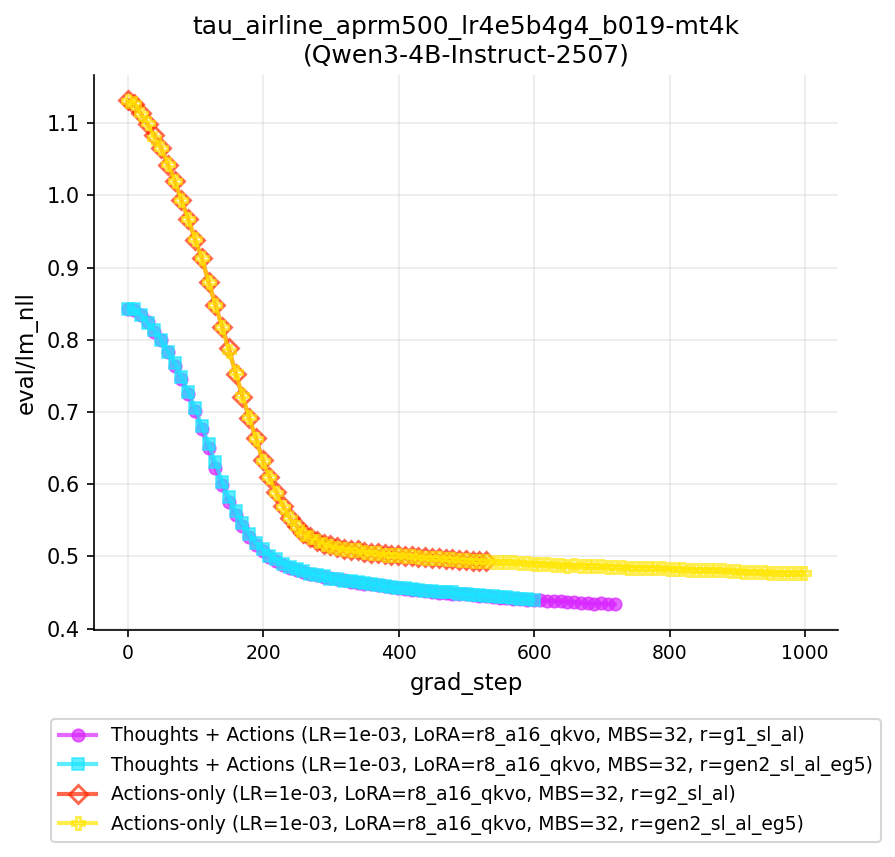

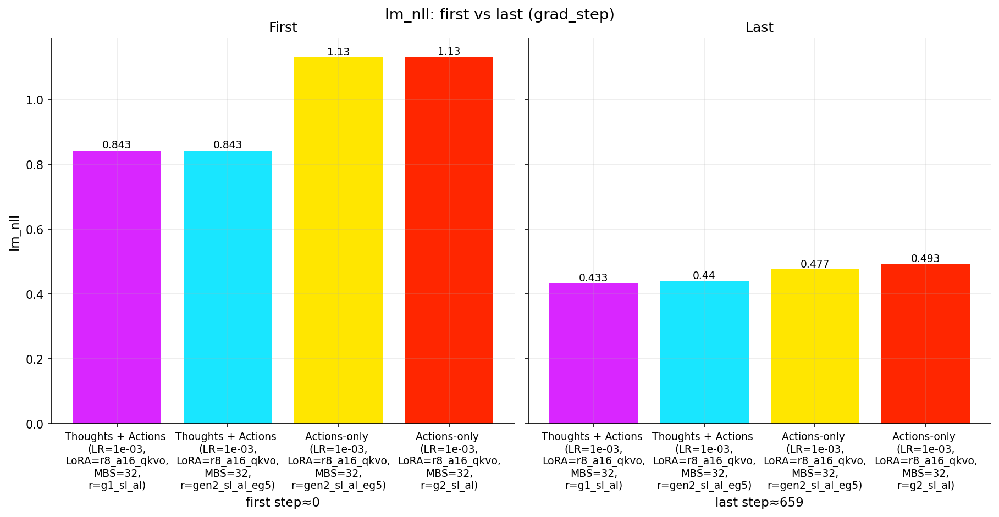

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

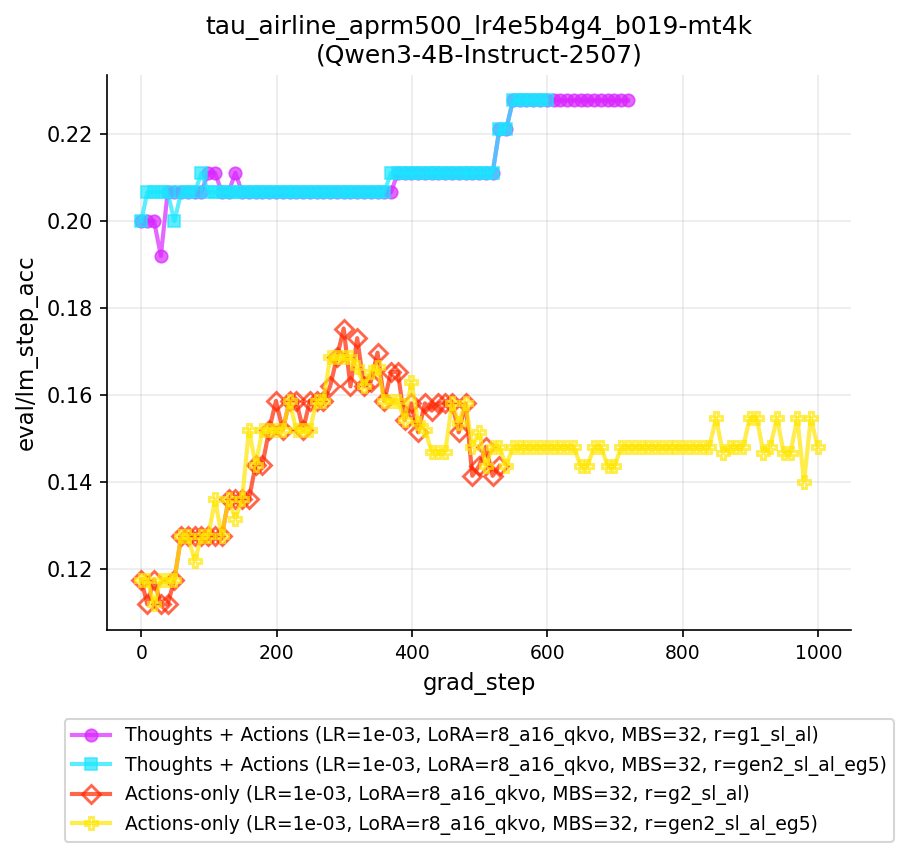

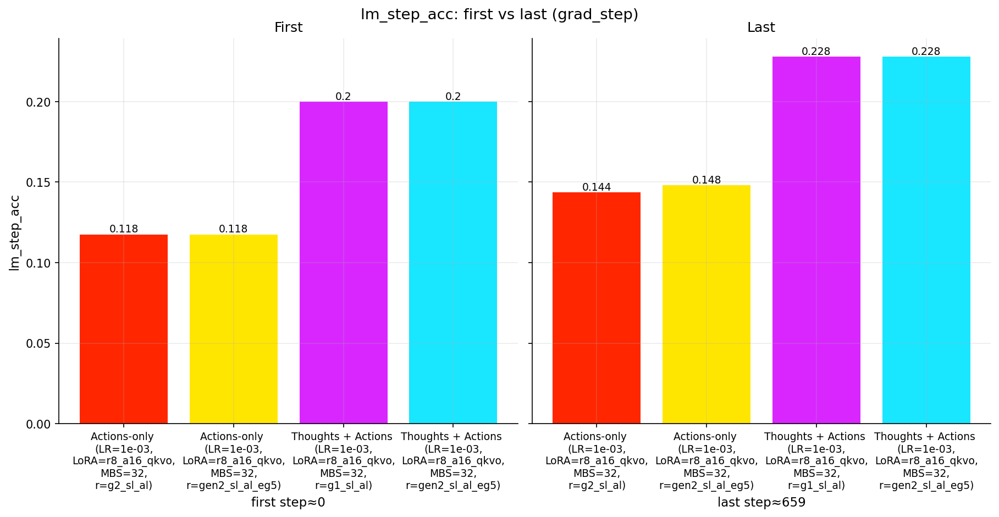

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

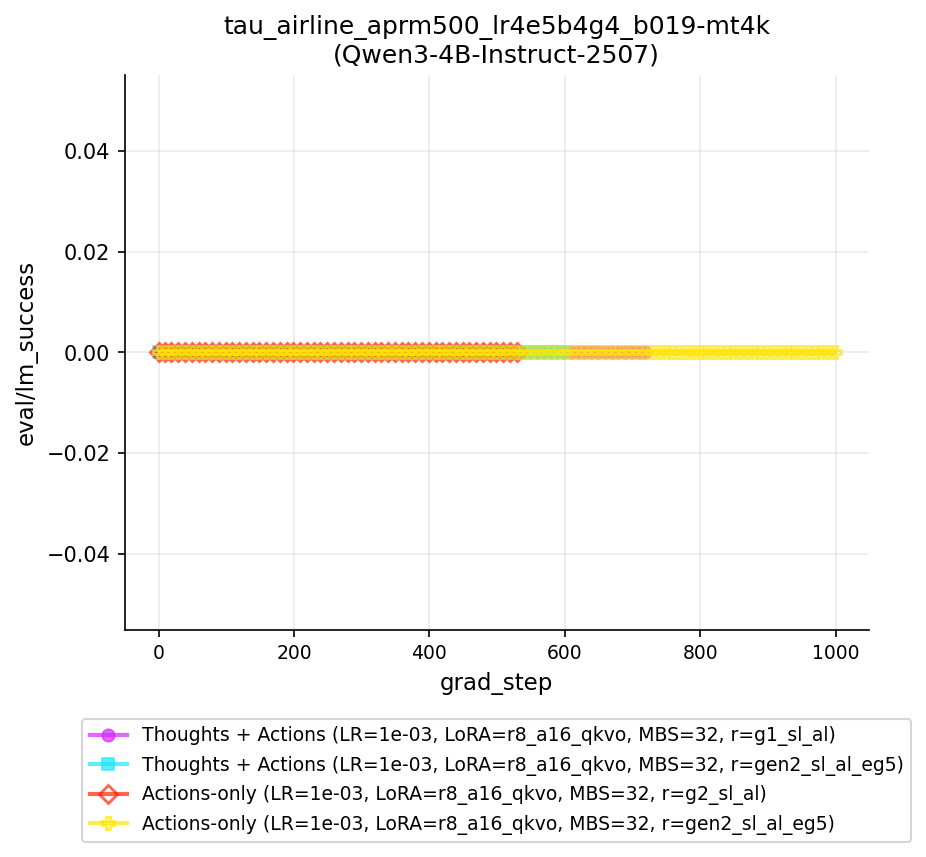

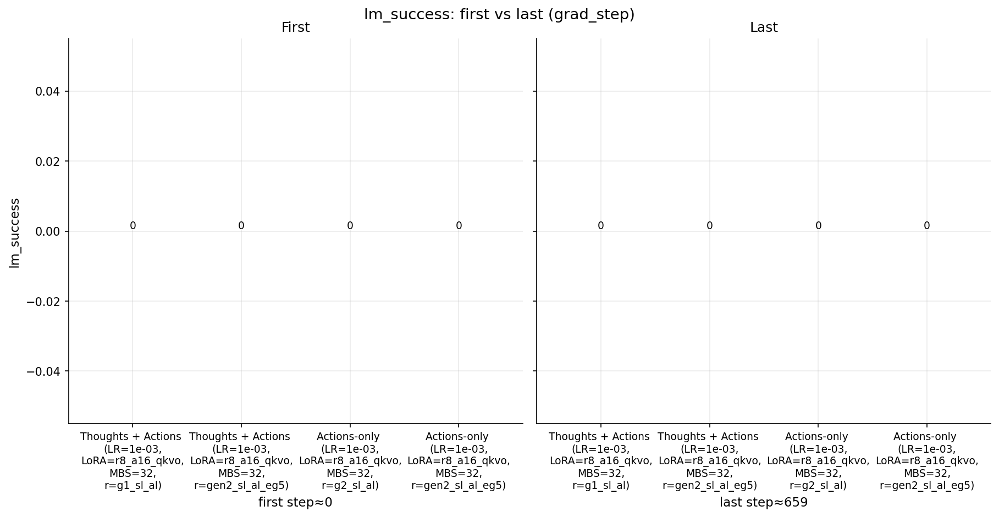

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

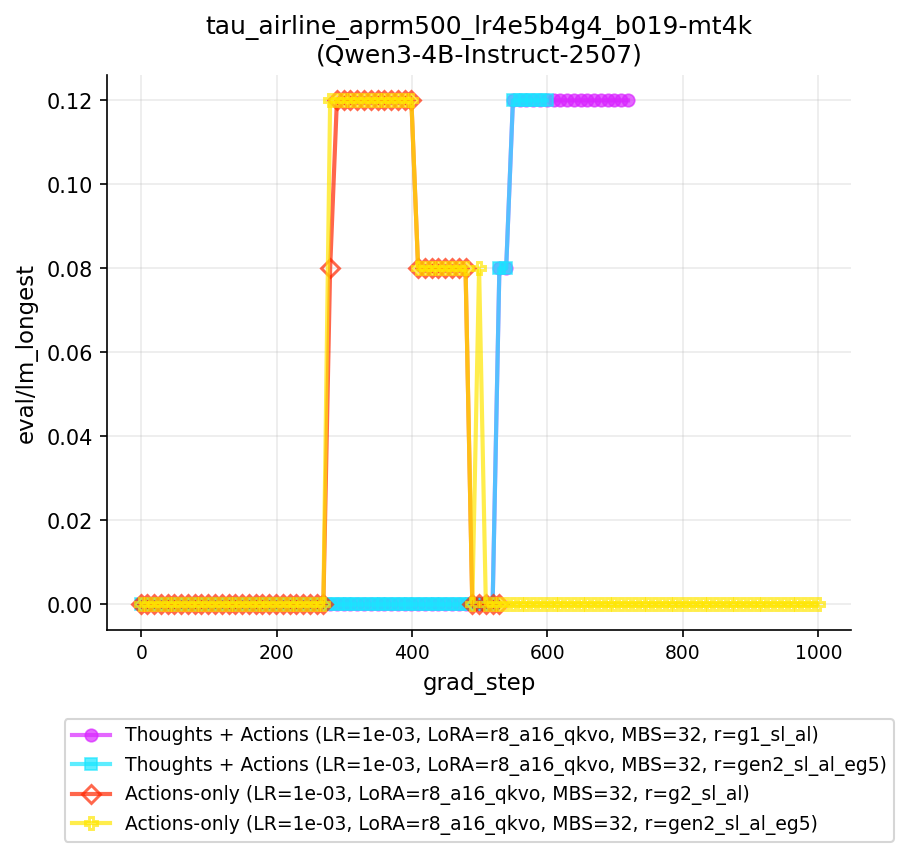

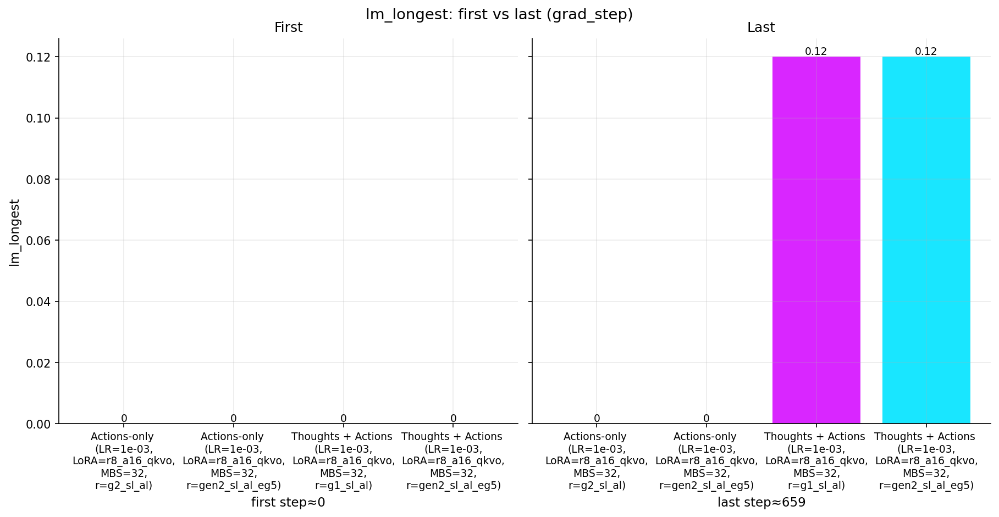

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

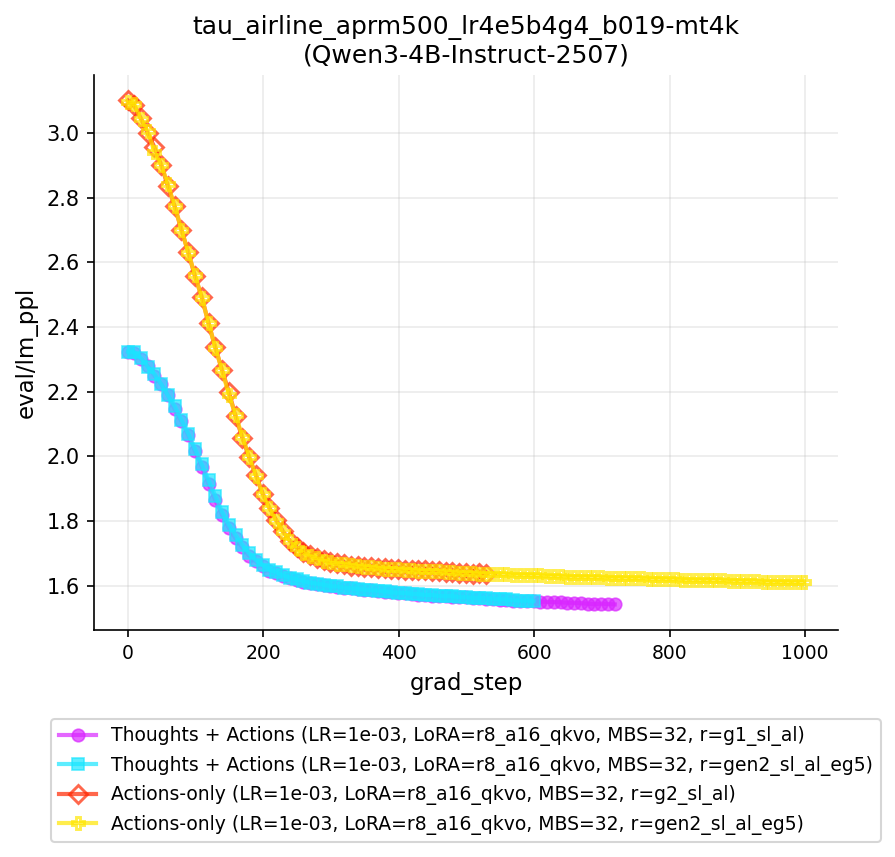

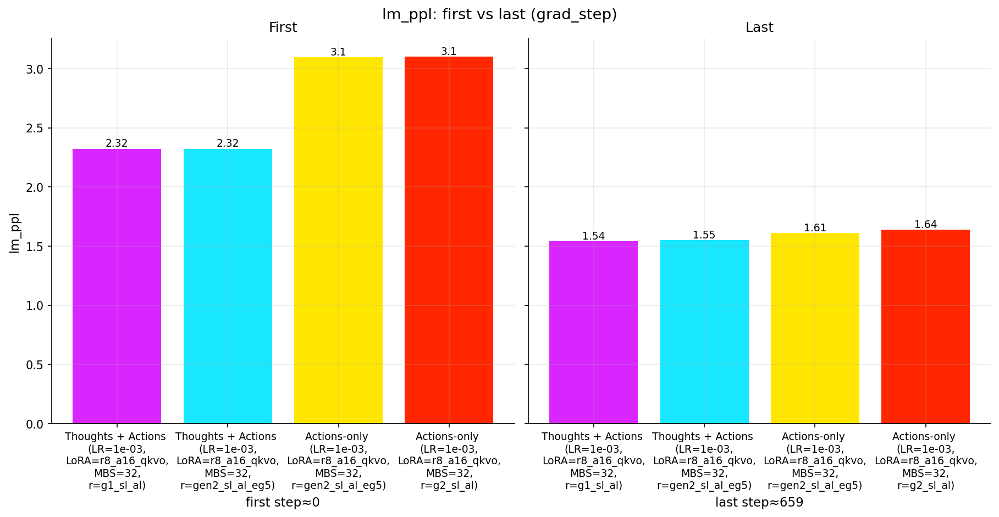

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

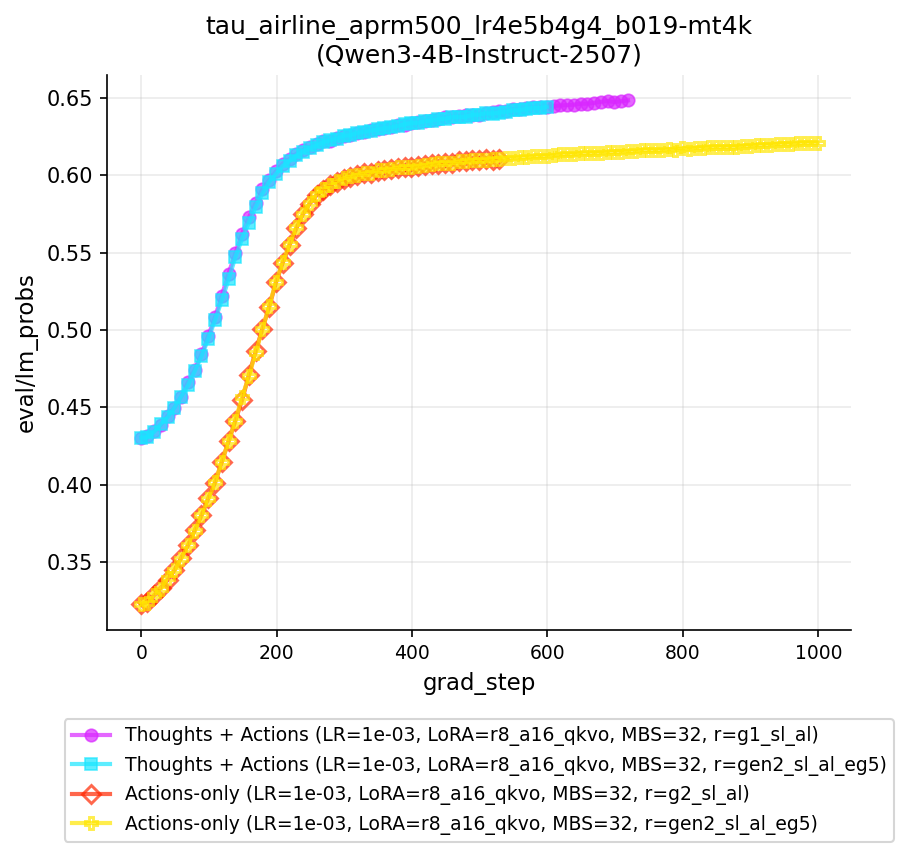

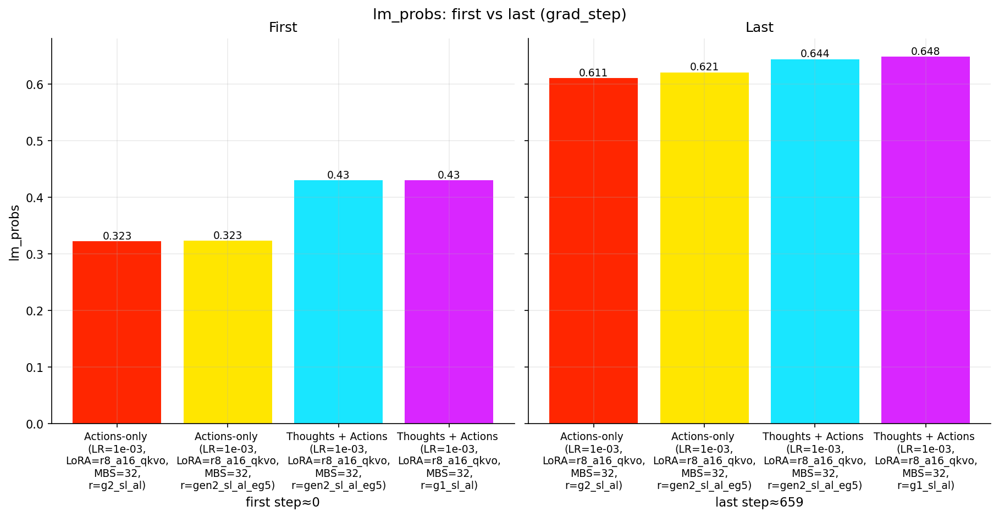

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

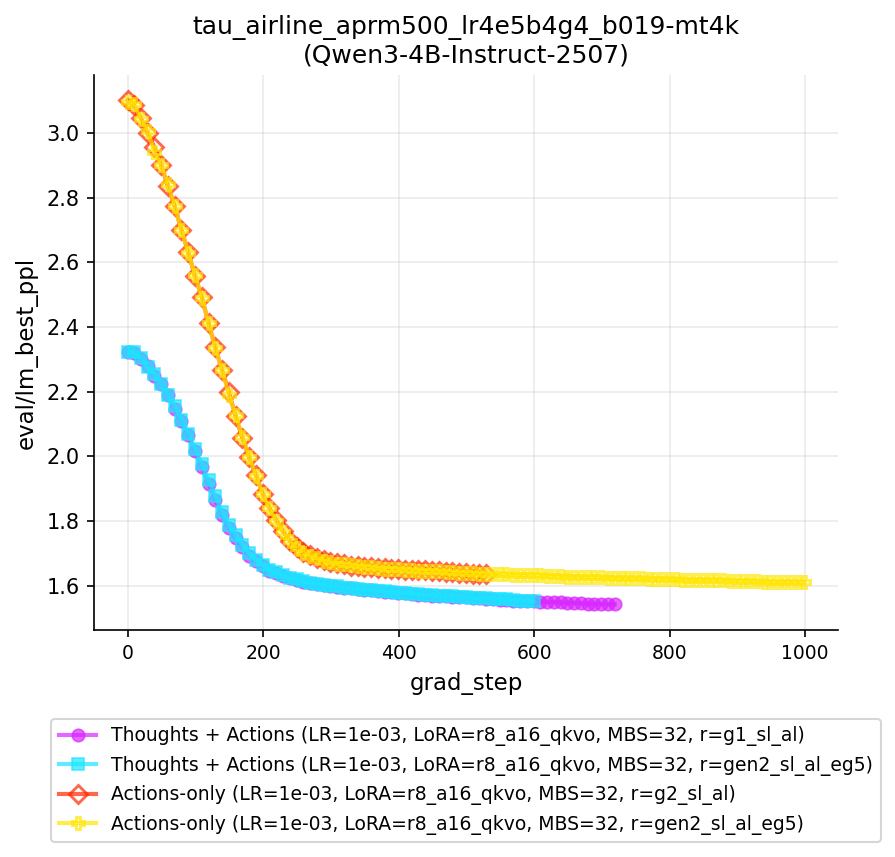

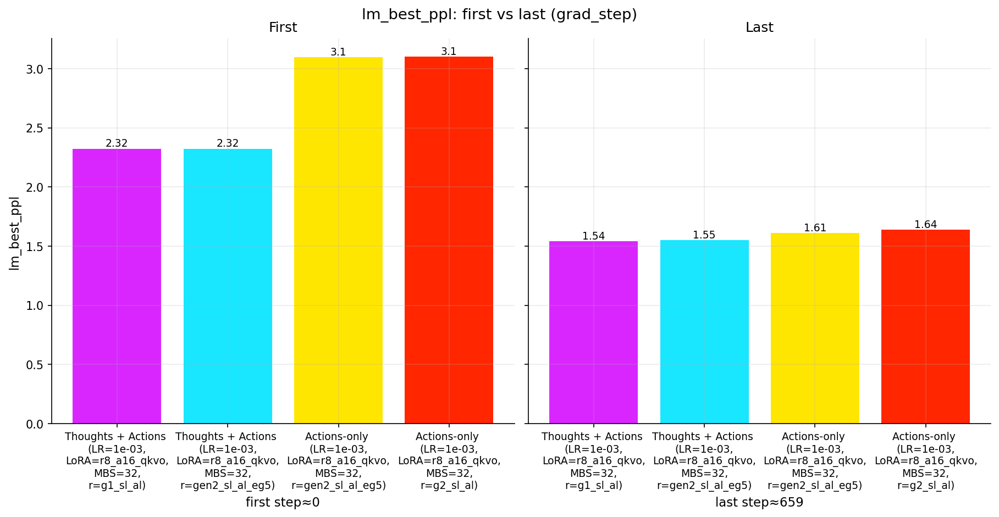

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
2 2
Loading data from ../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5

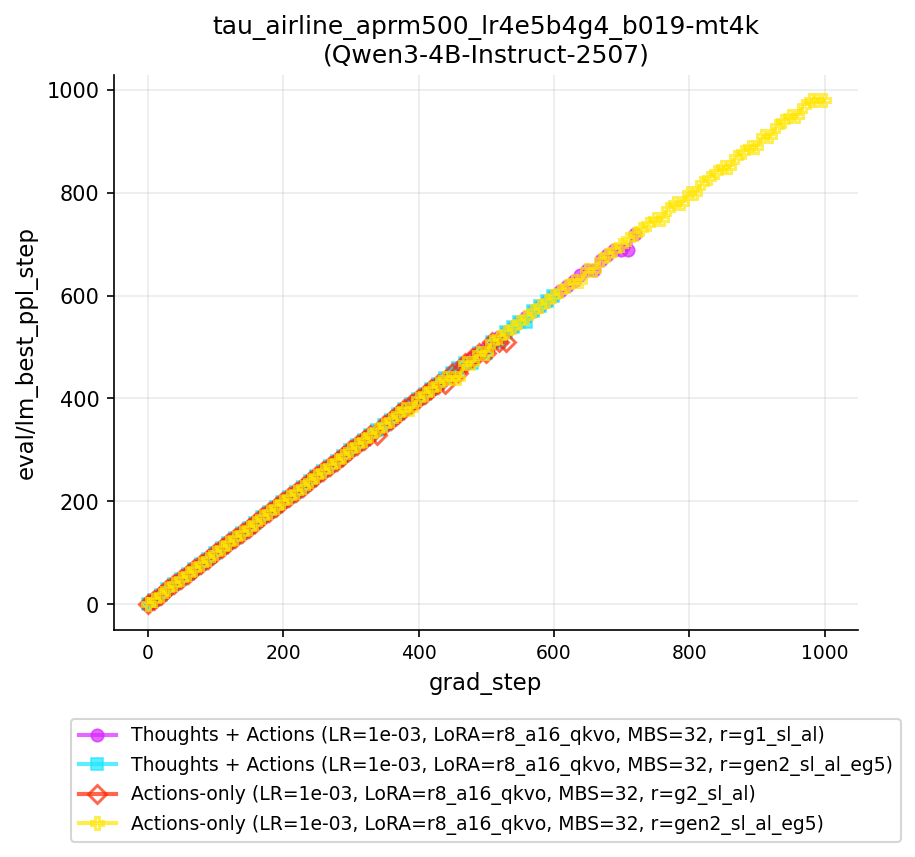

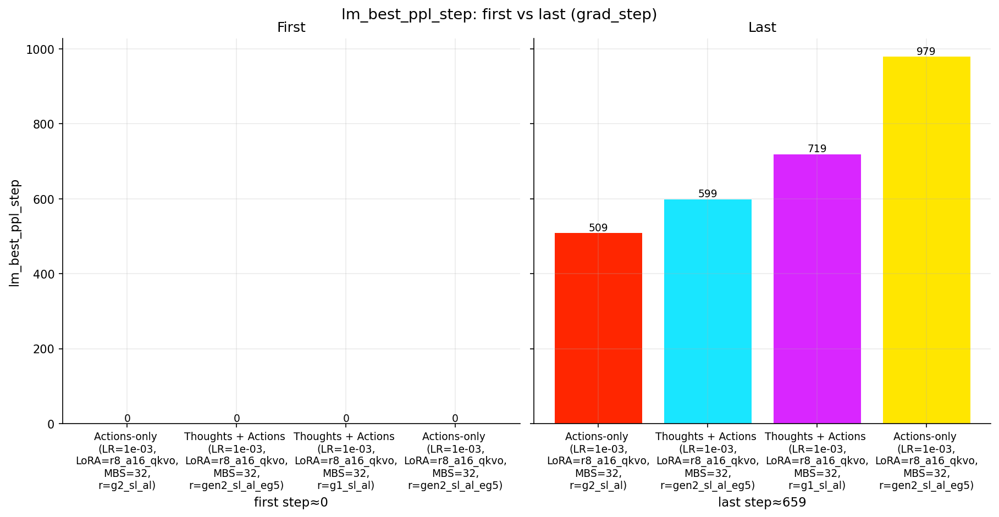

In [ ]:
import numpy as np

# base = join(LOG_DIR, "act_lm_snorkel_finance_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_finance_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_snorkel_finance_gt", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_snorkel_finance_pt_aprm_fs1_19_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_retail_gt_mt4k", "Qwen3_4B_Instruct_2507")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_tau_retail_aprm500_lr1e4b16g4_b009_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_snorkel_insurance_gt", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_8B")
# base = join(LOG_DIR, "act_lm_taubench_airline_gt_mt4k", "Qwen3_4B_Instruct_2507")
base = join(LOG_DIR, "act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_coin", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_treasure", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_tw_cooking_fsc_ms1_mt4k", "Qwen3_4B_Instruct_2507")

# base = join(LOG_DIR, "act_lm_browsecomp_gt_mt4k", "Qwen3_4B_Instruct_2507")


VALID_MODEL_CONFIG_MAP = {
    'hf_qwen3_4b_inst_2507': 'Qwen3_4B_Instruct_2507',
    'hf_qwen3_8b': 'Qwen3_8B'
}


verbose_labels = True

BARCHART_TYPE = "first"
FILE_KIND = "jsonl"
EVAL_KIND = "lm"
# EVAL_COLS = eval_lm_cols

markers = ["o", "s", "D", "P", "X", "H", "v", "<", ">", "^", "p", "*", "d", "1", "2", "3", "4"]
marker_idx = 0

valid_metrics_files = {}
for root, _dirs, files in os.walk(base):
    if "debug" in root:
        continue
    files_set = set(files)
    for name, kind in TARGET_FILES.items():
        if name not in files_set:
            continue
        p = Path(root) / name
        _model_config = str(p).split("-moco=")[-1].split("-")[0]
        if is_valid_metrics_file(p, kind) and (
            "lera=0_001" in str(p)
            and VALID_MODEL_CONFIG_MAP[_model_config] in str(p)
            # and "-nuevgesa=10-" not in str(p)
        ):
            if kind not in valid_metrics_files:
                valid_metrics_files[kind] = []
            valid_metrics_files[kind].append(p)
            # print(p)

for _kind in valid_metrics_files:
    valid_metrics_files[_kind] = sorted(valid_metrics_files[_kind], key=lambda x: "-acon=1" in str(x))


df = pd.read_json(valid_metrics_files[FILE_KIND][0], lines=True)
display(df.head())

ignore_cols = [
    'eval/eval_idx', 'eval/best_ppl', 'eval/best_ppl_step',
]

ignore_cols.extend(
    ['rollout_eval_eval/try_0/final_reward', 'rollout_eval_eval/try_0/final_reward_std', 'rollout_eval_eval/try_0/final_reward_max', 'rollout_eval_eval/try_0/first_return', 'rollout_eval_eval/try_0/first_return_std', 'rollout_eval_eval/try_0/first_return_max', 'rollout_eval_eval/try_0/action_prob', 'rollout_eval_eval/try_0/action_prob_std', 'rollout_eval_eval/try_0/action_prob_max', 'rollout_eval_eval/try_0/last_state_len', 'rollout_eval_eval/try_0/last_state_len_std', 'rollout_eval_eval/try_0/last_state_len_max', 'rollout_eval_eval/try_0/timesteps', 'rollout_eval_eval/try_0/timesteps_std', 'rollout_eval_eval/try_0/timesteps_max', 'rollout_eval_eval/try_0/correct', 'rollout_eval_eval/try_0/correct_std', 'rollout_eval_eval/try_0/correct_max', 'rollout_eval_eval/try_0/total', 'rollout_eval_eval/try_0/total_std', 'rollout_eval_eval/try_0/total_max', 'rollout_eval_eval/try_0/accuracy', 'eval/ro_rollout_eval_eval/try_0/final_reward', 'eval/ro_rollout_eval_eval/try_0/final_reward_best', 'eval/ro_rollout_eval_eval/try_0/final_reward_best_step']
)
eval_gen_cols = [c for c in df.columns if "eval/gen" in c and c not in ignore_cols]
eval_lm_cols  = [c for c in df.columns if "eval/" in c and c not in eval_gen_cols and c not in ignore_cols]

EVAL_COLS = eval_lm_cols if EVAL_KIND == "lm" else eval_gen_cols

for key in EVAL_COLS:
    y_label = key
    x_label = "grad_step"

    names = unique_ids_from_strings(valid_metrics_files[FILE_KIND])

    labels = []
    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
        labels.append(_name)

    n_cool = sum("Thoughts" in s for s in labels)
    n_warm = len(labels) - n_cool
    print(n_cool, n_warm)
    get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

    marker_idx = 0

    # ---- NEW: collect first values (and first steps if you want to print them) ----
    first_vals = []
    first_steps = []
    last_vals = []
    last_steps = []
    bar_colors = []

    for _idx, fname in enumerate(valid_metrics_files[FILE_KIND]):
        _file_parts = str(fname).split("logs/")[-1].split("/")
        _task_env = _file_parts[0].replace("act_lm_", "")
        _llm_name = _file_parts[1].replace("_", "-")
        _title = f"{_task_env}\n({_llm_name})"

        df = pd.read_json(fname, lines=True)
        print("Loading data from", fname)

        try:
            _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
        except Exception:
            try:
                for k, v in KEY_MAP_FWD.items():
                    if k in df.columns:
                        df[v] = df[k]
                    elif v in df.columns:
                        df[k] = df[v]
                _df = df.dropna(subset=EVAL_COLS).sort_values(x_label)
            except Exception as e:
                print(f"Failed to prepare df for {fname}: {e}")
                continue

        label = labels[_idx]
        color = get_color(label)
        marker_style_dict = marker_style_for(label, color)

        # label = label.replace("(", "\n(").replace(", ", ",\n")

        # Line plot
        plt.plot(
            _df[x_label],
            _df[y_label],
            label=label,
            marker=markers[marker_idx % len(markers)],
            color=color,
            alpha=0.7,
            **marker_style_dict,
        )
        marker_idx += 1

        # ---- NEW: first value extraction ----
        if len(_df) > 0 and (y_label in _df.columns) and (x_label in _df.columns):
            first_steps.append(float(_df[x_label].iloc[0]))
            first_vals.append(float(_df[y_label].iloc[0]))
            # Also get last values
            last_steps.append(float(_df[x_label].iloc[-1]))
            last_vals.append(float(_df[y_label].iloc[-1]))
            
            # bar_colors.append(get_color(label))  # use same palette logic per label
            bar_colors.append(color)
        else:
            first_steps.append(np.nan)
            first_vals.append(np.nan)
            last_steps.append(np.nan)
            last_vals.append(np.nan)
            # bar_colors.append(get_color(label))
            bar_colors.append(color)
    # Finish line plot
    plt.title(_title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    y_anchor = -len(labels) * 0.1
    plt.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, y_anchor),
        ncol=1,
        frameon=True,
    )
    plt.show()
    plt.close()

    # ---- NEW: bar charts of first + last values side-by-side ----
    keep = [i for i, v in enumerate(first_vals) if np.isfinite(v) and np.isfinite(last_vals[i])]
    if len(keep) == 0:
        continue

    # Sort consistently (I usually sort by LAST so it's easy to see who ends best)
    order = sorted(keep, key=lambda i: last_vals[i])

    x = np.arange(len(order))

    first_plot_vals = [first_vals[i] for i in order]
    last_plot_vals  = [last_vals[i] for i in order]
    first_plot_steps = [first_steps[i] for i in order]
    last_plot_steps  = [last_steps[i] for i in order]

    lbls = [labels[i] for i in order]
    cols = [bar_colors[i] for i in order]

    # Optional: split labels across multiple lines
    lbls = [lbl.replace("(", "\n(").replace(", ", ",\n") for lbl in lbls]

    fig, (ax0, ax1) = plt.subplots(
        nrows=1, ncols=2,
        # figsize=(12, 4),
        figsize=(12, 6),
        sharey=True,             # important for fair comparison
        constrained_layout=True  # nicer than tight_layout for multi-axes
    )

    # --- First bars ---
    ax0.bar(x, first_plot_vals, color=cols)
    ax0.set_title("First")
    ax0.set_ylabel(key.replace("eval/", ""))
    ax0.set_xticks(x)
    ax0.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, first_plot_vals, first_plot_steps):
        ax0.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show first step under bars
    ax0.set_xlabel(f"first step≈{np.nanmedian(first_plot_steps):.0f}")

    # --- Last bars ---
    ax1.bar(x, last_plot_vals, color=cols)
    ax1.set_title("Last")
    ax1.set_xticks(x)
    ax1.set_xticklabels(
        lbls,
        # rotation=35,
        # ha="right",
    )

    for xi, v, st in zip(x, last_plot_vals, last_plot_steps):
        ax1.text(xi, v, f"{v:.3g}", ha="center", va="bottom", fontsize=9)
    # Optional: show last step under bars
    ax1.set_xlabel(f"last step≈{np.nanmedian(last_plot_steps):.0f}")

    fig.suptitle(f"{key.replace('eval/', '')}: first vs last (grad_step)", y=1.02)

    plt.show()
    plt.close(fig)
a

## Explore CSV data

In [19]:
valid_metrics_files

{'csv': [PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_lm_tau_airline_aprm500_lr4e5b4g4_b019-mt4k/Qwen3_4B_Instruct_2507/act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al/eval_lm_action_metrics.csv'),
  PosixPath('../logs/act_l

In [16]:
from analysis.files import *


def unique_ids_from_strings(
    items: Iterable[Union[str, Path]],
    *,
    token_sep: str = "-",
    missing: str = "NA",
    join_sep: str = "-",
    sanitize: bool = True,
    always_keys: Iterable[str] = (
        "actions_only", "hide_observations",
        "learning_rate", "mini_batch_size",
        "lora_config", "model_config",
    ),
) -> List[str]:
    """
    Create per-item identifiers using:
      - all kv keys whose values differ across items
      - PLUS any keys in always_keys (included regardless of uniqueness)
      - PLUS any non-kv tokens whose presence differs
    """
    # Convert keys to their filename versions
    always_keys = [get_argn(k) for k in always_keys]
    always_keys_set: Set[str] = set(always_keys)

    strings = [str(x) for x in items]
    if not strings:
        return []

    # --- 1) strip common prefix/suffix by path parts ---
    if len(strings) == 1:
        # With a single item, "common prefix/suffix" would erase everything.
        # Use just the filename (or use strings[0] if you want dirs included).
        # cores = [Path(strings[0]).name]
        parts = [Path(s).parts for s in strings]
        cores = []
        pref = 0
        for p in parts:
            core_parts = p
            cores.append("/".join(core_parts))
    else:
        parts = [Path(s).parts for s in strings]
        min_len = min(len(p) for p in parts)

        pref = 0
        for i in range(min_len):
            if all(p[i] == parts[0][i] for p in parts):
                pref += 1
            else:
                break

        suf = 0
        for j in range(1, min_len - pref + 1):
            if all(p[-j] == parts[0][-j] for p in parts):
                suf += 1
            else:
                break

        cores = []
        for p in parts:
            core_parts = p[pref : (len(p) - suf if suf > 0 else len(p))]
            cores.append("/".join(core_parts))

    # --- 2) parse each core into kv dict + misc tokens ---
    kv_dicts: List[Dict[str, str]] = []
    misc_sets: List[Set[str]] = []

    for core in cores:
        print("Core", core)
        toks = [t for t in core.split(token_sep) if t]
        kv: Dict[str, str] = {}
        misc: Set[str] = set()
        for t in toks:
            if "=" in t and t.count("=") == 1:
                k, v = t.split("=")
                kv[k] = v
            else:
                misc.add(t)
        kv_dicts.append(kv)
        misc_sets.append(misc)

    # --- 3) determine differing kv keys ---
    all_keys = sorted(set().union(*(d.keys() for d in kv_dicts)) | always_keys_set)

    differing_keys: Set[str] = set()
    for k in all_keys:
        vals = [(d.get(k, missing)) for d in kv_dicts]
        if len(set(vals)) > 1:
            differing_keys.add(k)

    # keys to include = differing OR always
    include_keys = [k for k in all_keys if (k in differing_keys) or (k in always_keys_set)]

    # --- 4) differing misc tokens (presence differs) ---
    all_misc = sorted(set().union(*misc_sets))
    differing_misc = []
    for t in all_misc:
        presence = [t in ms for ms in misc_sets]
        if len(set(presence)) > 1:
            differing_misc.append(t)

    # --- 5) build identifiers ---
    ids: List[str] = []
    for kv, ms in zip(kv_dicts, misc_sets):
        out_parts: List[str] = []
        for k in include_keys:
            out_parts.append(f"{k}={kv.get(k, missing)}")
        for t in differing_misc:
            if t in ms:
                out_parts.append(t)

        out = join_sep.join(out_parts) if out_parts else "all_same"
        if sanitize:
            out = (
                out.replace("/", "_")
                   .replace(" ", "")
                   .replace(":", "")
                   .replace("|", "_")
            )
        ids.append(out)

    # If still not unique, suffix duplicates deterministically
    seen: Dict[str, int] = {}
    final: List[str] = []
    for x in ids:
        c = seen.get(x, 0)
        seen[x] = c + 1
        final.append(x if c == 0 else f"{x}{join_sep}{c}")

    return final

In [ ]:
_x_label = "rollout_action_timestep"
# _y_label = "rollout_action_nll"
_y_label = "rollout_action_ppl"
_c_label = "train_step_idx"

verbose_labels = True

_valid_metrics_files = [f for f in valid_metrics_files["csv"]]  #  if "re=gen2" in str(f)]

task_indices = pd.read_csv(_valid_metrics_files[0])["task_idx"].unique()
names = unique_ids_from_strings(_valid_metrics_files)
labels = []
for _idx, fname in enumerate(_valid_metrics_files):
    _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
    labels.append(_name)

n_cool = sum("Thoughts" in s for s in labels)
n_warm = len(labels) - n_cool
get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

# for _task_idx in task_indices:
_task_idx = task_indices[-1]
for _idx, path_df in enumerate(_valid_metrics_files):
    label = labels[_idx]
    # color = get_color(label)
    # color = "tab:blue" if "Thoughts" in label else "tab:orange"
    _df = pd.read_csv(path_df)
    # _df = _df[_df["train_step_idx"] == 0]
    # _df_task = _df[_df["task_idx"] == _task_idx]
    _df_task = _df
    plt.scatter(
        _df_task[_x_label],
        _df_task[_y_label],
        label=label,
        # color=color,
        c=_df_task["train_step_idx"],
        cmap="viridis",
        alpha=0.25,
    )  # c=_df_task[_c_label], 
    # _df_task_mean = _df_task.groupby(_x_label).mean().reset_index()
    # plt.plot(_df_task_mean[_x_label], _df_task_mean[_y_label], color=color)

# plt.title(f"Task {_task_idx}")
plt.title(f"Average over {_task_idx + 1} tasks")
plt.xlabel(_x_label)
plt.ylabel(_y_label)
plt.colorbar(label=_c_label)
plt.legend(
    loc="lower center",
    bbox_to_anchor=(0.5, -len(labels) / 6 * 0.5),
    ncol=1,
    frameon=True,
)
plt.show()


In [25]:
COLOR_MAPS

['Blues',
 'Oranges',
 'Greens',
 'Reds',
 'Purples',
 'Greys',
 'YlOrBr',
 'YlOrRd',
 'OrRd',
 'PuRd',
 'RdPu',
 'BuPu',
 'GnBu',
 'PuBu',
 'YlGnBu',
 'PuBuGn',
 'BuGn',
 'YlGn']

Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=g1_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=g2_sl_al
Core act-prm-tinker-isas=0-reru=0-enco=act_lm_tau_airline_aprm500_lr4e5b4g4_b019_mt4k-trco=pt_sft_gen5-moco=hf_qwen3_4b_inst_2507-loco=r8_a16_qkvo-gracst=32-acon=1-hiob=1-lera=0_001-mibasi=32-se=0-re=gen2_sl_al_eg5


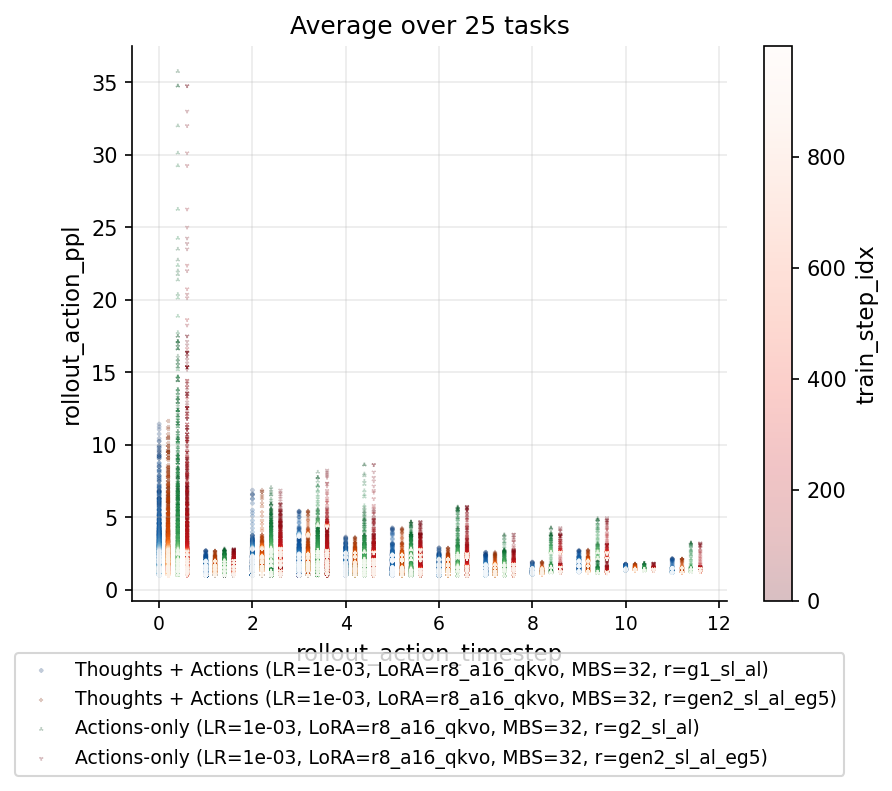

In [32]:
_x_label = "rollout_action_timestep"
# _y_label = "rollout_action_nll"
_y_label = "rollout_action_ppl"
_c_label = "train_step_idx"

NEW_MARKERS = ["x", "+", "1", "2", "3", "4", "|", "-"]
COLOR_MAPS = ["Blues", "Oranges", "Greens", "Reds", "Purples", "Greys", "YlOrBr", "YlOrRd", "OrRd", "PuRd", "RdPu", "BuPu", "GnBu", "PuBu", "YlGnBu", "PuBuGn", "BuGn", "YlGn"]

verbose_labels = True

_valid_metrics_files = [f for f in valid_metrics_files["csv"]]  #  if "re=gen2" in str(f)]

task_indices = pd.read_csv(_valid_metrics_files[0])["task_idx"].unique()
names = unique_ids_from_strings(_valid_metrics_files)
labels = []
for _idx, fname in enumerate(_valid_metrics_files):
    _name = get_name_from_uid(names[_idx], verbose=verbose_labels)
    labels.append(_name)

n_cool = sum("Thoughts" in s for s in labels)
n_warm = len(labels) - n_cool
get_color = make_group_color_getter(n_cool=n_cool, n_warm=n_warm)

# for _task_idx in task_indices:
_task_idx = task_indices[-1]
marker_idx = 0
for _idx, path_df in enumerate(_valid_metrics_files):
    label = labels[_idx]
    # color = get_color(label)
    # color = "tab:blue" if "Thoughts" in label else "tab:orange"
    _df = pd.read_csv(path_df)
    # _df = _df[_df["train_step_idx"] == 0]
    # _df_task = _df[_df["task_idx"] == _task_idx]
    _df_task = _df
    color = get_color(label)
    # marker_style_dict = marker_style_for(label, color)
    plt.scatter(
        _df_task[_x_label] + _idx * 0.2,
        _df_task[_y_label],
        label=label,
        # color=color,
        c=_df_task["train_step_idx"],
        # cmap="viridis",
        cmap=f"{COLOR_MAPS[marker_idx % len(COLOR_MAPS)]}_r",
        alpha=0.25,
        # **marker_style_dict,
        marker=NEW_MARKERS[marker_idx % len(NEW_MARKERS)],
        s=1,
    )  # c=_df_task[_c_label], 
    # _df_task_mean = _df_task.groupby(_x_label).mean().reset_index()
    # plt.plot(_df_task_mean[_x_label], _df_task_mean[_y_label], color=color)
    marker_idx += 1

# plt.title(f"Task {_task_idx}")
plt.title(f"Average over {_task_idx + 1} tasks")
plt.xlabel(_x_label)
plt.ylabel(_y_label)
plt.colorbar(label=_c_label)
plt.legend(
    loc="lower center",
    bbox_to_anchor=(0.5, -len(labels) / 6 * 0.5),
    ncol=1,
    frameon=True,
)
plt.show()


In [22]:
marker_style_dict

{'markerfacecolor': (np.float64(0.8509803921568627),
  np.float64(0.14901960784313725),
  np.float64(1.0),
  np.float64(1.0)),
 'markeredgecolor': (np.float64(0.8509803921568627),
  np.float64(0.14901960784313725),
  np.float64(1.0),
  np.float64(1.0)),
 'markeredgewidth': 0.8}